# Project 31

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import layers
import tensorflow_datasets as tfds
from imgaug import augmenters as iaa
import imgaug as ia
tfds.disable_progress_bar()
tf.random.set_seed(42)
ia.seed(42)

In [2]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
print(f"Total training examples: {len(x_train)}")
print(f"Total test examples: {len(x_test)}")

Total training examples: 50000
Total test examples: 10000


In [3]:
AUTO = tf.data.AUTOTUNE
BATCH_SIZE = 128
EPOCHS = 1
IMAGE_SIZE = 72

In [4]:
rand_aug = iaa.RandAugment(n=3, m = 7)
def augment(images):
    images = tf.cast(images, tf.uint8)
    return rand_aug(images=images.numpy())


In [6]:
train_ds_rand = (tf.data.Dataset.from_tensor_slices((x_train, y_train))
                .shuffle(BATCH_SIZE * 100)
                .batch(BATCH_SIZE)
                .map(lambda x, y: (tf.image.resize(x, (IMAGE_SIZE, IMAGE_SIZE)), y), num_parallel_calls=AUTO)
                .map(lambda x, y: (tf.py_function(augment, [x], [tf.float32])[0], y), num_parallel_calls=AUTO)
                .prefetch(AUTO))
test_ds = (tf.data.Dataset.from_tensor_slices((x_test, y_test))
          .batch(BATCH_SIZE)
          .map(lambda x, y: (tf.image.resize(x, (IMAGE_SIZE, IMAGE_SIZE)), y), num_parallel_calls=AUTO)
          .prefetch(AUTO))

In [7]:
simple_aug = tf.keras.Sequential([
    layers.Resizing(IMAGE_SIZE, IMAGE_SIZE), 
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(factor=0.02),
    layers.RandomZoom(height_factor=0.2, width_factor=0.2)
])
train_ds_simple = (tf.data.Dataset.from_tensor_slices((x_train, y_train))
                  .shuffle(BATCH_SIZE * 100)
                  .batch(BATCH_SIZE)
                  .map(lambda x, y: (simple_aug(x), y), num_parallel_calls=AUTO)
                  .prefetch(AUTO))

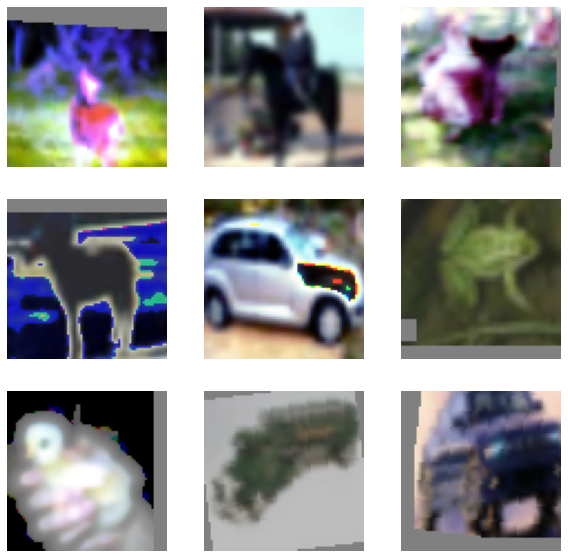

In [8]:
sample_images, _ = next(iter(train_ds_rand))
plt.figure(figsize=(10, 10))
for i, image in enumerate(sample_images[:9]):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image.numpy().astype("int"))
    plt.axis("off")

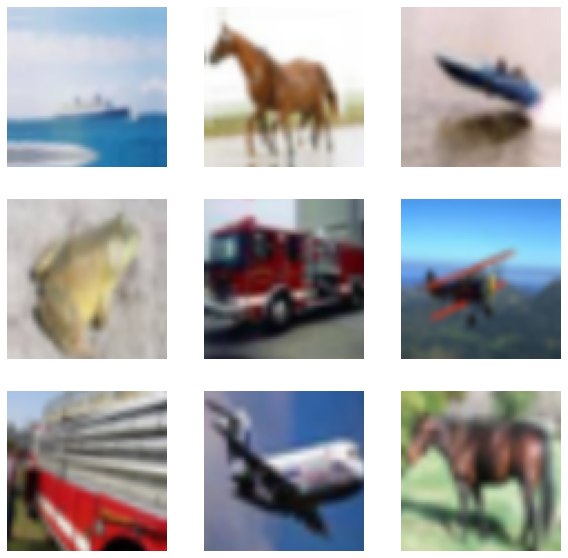

In [9]:
sample_images, _ = next(iter(train_ds_simple))
plt.figure(figsize=(10, 10))
for i, image in enumerate(sample_images[:9]):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image.numpy().astype("int"))
    plt.axis("off")

In [10]:
def get_training_model():
    resnet50_v2 = tf.keras.applications.ResNet50V2(weights=None, include_top=True, 
                                                   input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3), 
                                                  classes=10)
    model = tf.keras.Sequential([
        layers.Input((IMAGE_SIZE, IMAGE_SIZE, 3)),
        layers.Rescaling(scale=1.0 / 127.5, offset=-1),
        resnet50_v2
    ])
    return model
print(get_training_model().summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 72, 72, 3)         0         
                                                                 
 resnet50v2 (Functional)     (None, 10)                23585290  
                                                                 
Total params: 23,585,290
Trainable params: 23,539,850
Non-trainable params: 45,440
_________________________________________________________________
None


In [11]:
rand_aug_model = get_training_model()
rand_aug_model.compile(loss="sparse_categorical_crossentropy", optimizer="adam", metrics=["accuracy"])
rand_aug_model.fit(train_ds_rand, validation_data=test_ds, epochs=EPOCHS)
_, test_acc = rand_aug_model.evaluate(test_ds)
print("Test accuracy: {:.2f}%".format(test_acc * 100))

79/79 [==============================] - 87s 1s/step - loss: 1.5887 - accuracy: 0.4629
Test accuracy: 46.29%


In [12]:
simple_aug_model = get_training_model()
simple_aug_model.compile(loss="sparse_categorical_crossentropy", optimizer="adam", metrics=["accuracy"])
simple_aug_model.fit(train_ds_simple, validation_data=test_ds, epochs=EPOCHS)
_, test_acc = simple_aug_model.evaluate(test_ds)
print("Test accuracy: {:.2f}%".format(test_acc * 100))

79/79 [==============================] - 88s 1s/step - loss: 1.4082 - accuracy: 0.5277
Test accuracy: 52.77%


# Project 32

In [3]:
from collections import defaultdict
import random
import numpy as np
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
from tqdm import tqdm

In [5]:
num_classes = 10
input_shape = (32, 32, 3)
(x_train, y_train), (x_test, y_test) = keras.datasets.cifar10.load_data()
x_data = np.concatenate([x_train, x_test])
y_data = np.concatenate([y_train, y_test])
print("x_data shape:", x_data.shape, "- y_data shape:", y_data.shape)
classes = [
    "airplane",
    "automobile",
    "bird",
    "cat",
    "deer",
    "dog",
    "frog",
    "horse",
    "ship",
    "truck"
]

x_data shape: (60000, 32, 32, 3) - y_data shape: (60000, 1)


In [6]:
target_size = 32
representation_dim = 512
projection_units = 128
num_clusters = 20
k_neighbours = 5
tune_encoder_during_clustering = False

In [7]:
data_preprocessing = keras.Sequential([
    layers.Resizing(target_size, target_size),
    layers.Normalization()
])
data_preprocessing.layers[-1].adapt(x_data)

In [9]:
data_augmentation = keras.Sequential([
    layers.RandomTranslation(height_factor=(-0.2, 0.2), width_factor=(-0.2, 0.2), fill_mode="nearest"),
    layers.RandomFlip(mode="horizontal"),
    layers.RandomRotation(factor=0.15, fill_mode="nearest"),
    layers.RandomZoom(height_factor=(-0.3, 0.1), width_factor=(-0.3, 0.1), fill_mode="nearest")
])

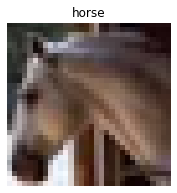

In [10]:
image_idx = np.random.choice(range(x_data.shape[0]))
image = x_data[image_idx]
image_class = classes[y_data[image_idx][0]]
plt.figure(figsize=(3, 3))
plt.imshow(x_data[image_idx].astype("uint8"))
plt.title(image_class)
_ = plt.axis("off")

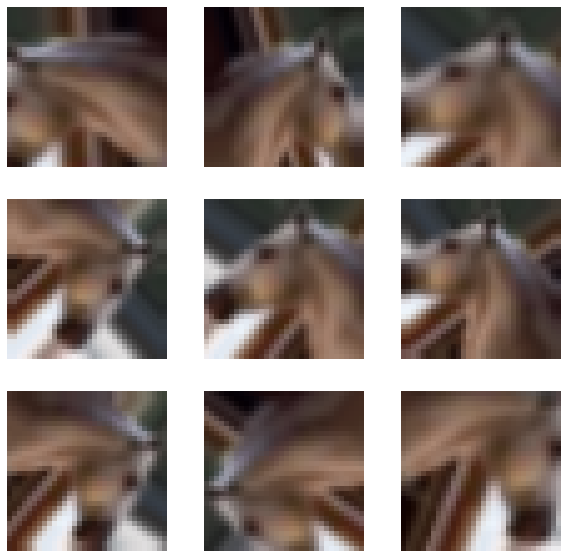

In [11]:
plt.figure(figsize=(10, 10))
for i in range(9):
    augmented_images = data_augmentation(np.array([image]))
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

In [15]:
def create_encoder(representation_dim):
    encoder = keras.Sequential([
        keras.applications.ResNet50V2(include_top=False, weights=None, pooling="avg"),
        layers.Dense(representation_dim)
    ])
    return encoder

In [28]:
class RepresentationLearner(keras.Model):
    def __init__(self, encoder, projection_units, num_augmentation, temperature=1.0, dropout_rate=0.1, 
                 l2_normalize=False, **kwargs):
        super(RepresentationLearner, self).__init__(**kwargs)
        self.encoder = encoder
        self.projector = keras.Sequential([
            layers.Dropout(dropout_rate),
            layers.Dense(units=projection_units, use_bias=False),
            layers.BatchNormalization(),
            layers.ReLU()
        ])
        self.num_augmentations = num_augmentation
        self.temperature = temperature
        self.l2_normalize = l2_normalize
        self.loss_tracker = keras.metrics.Mean(name="loss")
    @property
    def metrics(self):
        return [self.loss_tracker]
    
    def compute_contrastive_loss(self, feature_vectors, batch_size):
        num_augmentations = tf.shape(feature_vectors)[0] // batch_size
        if self.l2_normalize:
            feature_vectors = tf.math.l2_normalize(feature_vectors, -1)
        logits = (tf.linalg.matmul(feature_vectors, feature_vectors, transpose_b=True) / self.temperature)
        logits_max = tf.math.reduce_max(logits, axis=1)
        logits = logits - logits_max
        targets = tf.tile(tf.eye(batch_size), [num_augmentations, num_augmentations])
        return keras.losses.categorical_crossentropy(y_true=targets, y_pred=logits, from_logits=True)
    def call(self, inputs):
        preprocessed = data_preprocessing(inputs)
        augmented = []
        for _ in range(self.num_augmentations):
            augmented.append(data_augmentation(preprocessed))
        augmented = layers.Concatenate(axis=0)(augmented)
        features = self.encoder(augmented)
        return self.projector(features)
    def train_step(self, inputs):
        batch_size = tf.shape(inputs)[0]
        with tf.GradientTape() as tape:
            feature_vectors = self(inputs, training=True)
            loss = self.compute_contrastive_loss(feature_vectors, batch_size)
        trainable_vars = self.trainable_variables
        gradients = tape.gradient(loss, trainable_vars)
        self.optimizer.apply_gradients(zip(gradients, trainable_vars))
        self.loss_tracker.update_state(loss)
        return {m.name: m.result() for m in self.metrics}
    def test_step(self, inputs):
        batch_size = tf.shape(inputs)[0]
        feature_vectors = self(inputs, training=False)
        loss = self.compute_contrastive_loss(feature_vectors, batch_size)
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

In [29]:
encoder = create_encoder(representation_dim)
representation_learner = RepresentationLearner(encoder, projection_units, num_augmentation=2, temperature=0.1)
lr_scheduler = keras.optimizers.schedules.CosineDecay(initial_learning_rate=0.001, decay_steps=500, alpha=0.1)
representation_learner.compile(optimizer=tfa.optimizers.AdamW(learning_rate=lr_scheduler, weight_decay=0.0001))
history = representation_learner.fit(x=x_data, batch_size=512, epochs=50)

Epoch 1/50
118/118 [==============================] - 4730s 40s/step - loss: 36.6514
Epoch 2/50
118/118 [==============================] - 4381s 37s/step - loss: 11.8375
Epoch 3/50
118/118 [==============================] - 4382s 37s/step - loss: 10.8969
Epoch 4/50
118/118 [==============================] - 4351s 37s/step - loss: 10.6298
Epoch 5/50
118/118 [==============================] - 4348s 37s/step - loss: 10.5558
Epoch 6/50
118/118 [==============================] - 4391s 37s/step - loss: 10.4624
Epoch 7/50
118/118 [==============================] - 4372s 37s/step - loss: 10.3876
Epoch 8/50
118/118 [==============================] - 4358s 37s/step - loss: 10.3026
Epoch 9/50
118/118 [==============================] - 4360s 37s/step - loss: 10.2144
Epoch 10/50
118/118 [==============================] - 4379s 37s/step - loss: 10.0587
Epoch 11/50
118/118 [==============================] - 4373s 37s/step - loss: 9.9923
Epoch 12/50
118/118 [==============================] - 5669s 48s

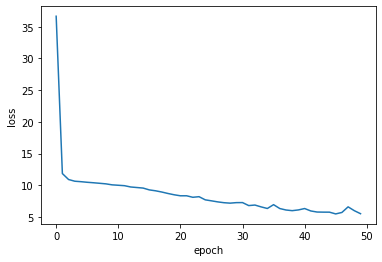

In [31]:
plt.plot(history.history["loss"])
plt.ylabel("loss")
plt.xlabel("epoch")
plt.show()

In [32]:
batch_size = 500
feature_vectors = encoder.predict(x_data, batch_size=batch_size, verbose=1)
feature_vectors = tf.math.l2_normalize(feature_vectors, -1)

120/120 [==============================] - 88s 730ms/step


In [33]:
neighbours = []
num_batches = feature_vectors.shape[0] // batch_size
for batch_idx in tqdm(range(num_batches)):
    start_idx = batch_idx * batch_size
    end_idx = start_idx + batch_size
    current_batch = feature_vectors[start_idx:end_idx]
    similarities = tf.linalg.matmul(current_batch, feature_vectors, transpose_b=True)
    _, indices = tf.math.top_k(similarities, k=k_neighbours + 1, sorted=True)
    neighbours.append(indices[..., 1:])
neighbours = np.reshape(np.array(neighbours), (-1, k_neighbours))

100%|██████████| 120/120 [00:19<00:00,  6.08it/s]


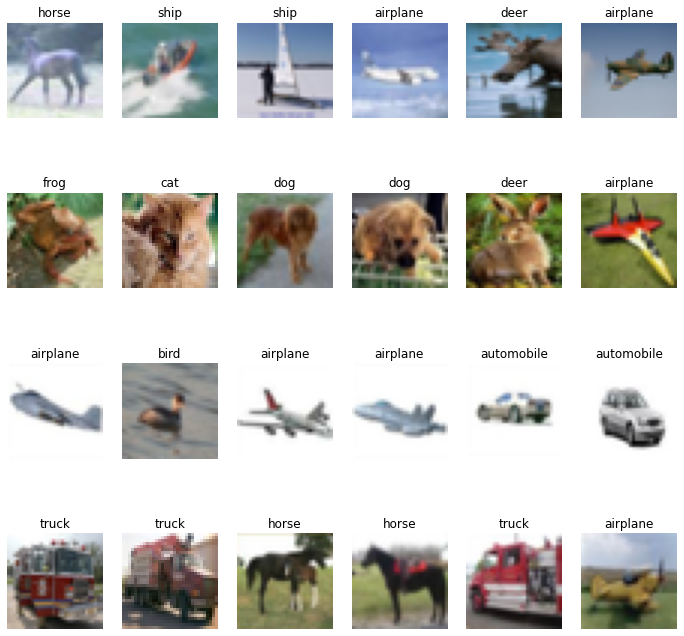

In [34]:
nrows = 4
ncols = k_neighbours + 1
plt.figure(figsize=(12, 12))
position = 1
for _ in range(nrows):
    anchor_idx = np.random.choice(range(x_data.shape[0]))
    neighbour_indices = neighbours[anchor_idx]
    indices = [anchor_idx] + neighbour_indices.tolist()
    for j in range(ncols):
        plt.subplot(nrows, ncols, position)
        plt.imshow(x_data[indices[j]].astype("uint8"))
        plt.title(classes[y_data[indices[j]][0]])
        plt.axis("off")
        position += 1

In [45]:
class ClustersConsistencyLoss(keras.losses.Loss):
    def __init__(self):
        super(ClustersConsistencyLoss, self).__init__()
    def __call__(self, target, similarity, sample_weight=None):
        target = tf.ones_like(similarity)
        loss = keras.losses.binary_crossentropy(y_true=target, y_pred=similarity, from_logits=True)
        return tf.math.reduce_mean(loss)

In [46]:
class ClustersEntropyLoss(keras.losses.Loss):
    def __init__(self, entropy_loss_weight=1.0):
        super(ClustersEntropyLoss, self).__init__()
        self.entropy_loss_weight = entropy_loss_weight
    def __call__(self, target, cluster_probabilities, sample_weight=None):
        num_clusters = tf.cast(tf.shape(cluster_probabilities)[-1], tf.dtypes.float32)
        target = tf.math.log(num_clusters)
        cluster_probabilities = tf.math.reduce_mean(cluster_probabilities, axis=0)
        cluster_probabilities = tf.clip_by_value(cluster_probabilities, clip_value_min=1e-8, clip_value_max=1.0)
        entropy = -tf.math.reduce_sum(cluster_probabilities * tf.math.log(cluster_probabilities))
        loss = target - entropy
        return loss

In [47]:
def create_clustering_model(encoder, num_clusters, name=None):
    inputs = keras.Input(shape=input_shape)
    preprocessed = data_preprocessing(inputs)
    augmented = data_augmentation(preprocessed)
    features = encoder(augmented)
    outputs = layers.Dense(units=num_clusters, activation="softmax")(features)
    model = keras.Model(inputs=inputs, outputs=outputs, name=name)
    return model

In [48]:
def create_clustering_learner(clustering_model):
    anchor = keras.Input(shape=input_shape, name="anchors")
    neighbours = keras.Input(shape=tuple([k_neighbours]) + input_shape, name="neighbours")
    neighbours_reshaped = tf.reshape(neighbours, shape=tuple([-1]) + input_shape)
    anchor_clusters = clustering_model(anchor)
    neighbours_clustering = clustering_model(neighbours_reshaped)
    neighbours_clustering = tf.reshape(neighbours_clustering, shape=(-1, k_neighbours, 
                                                                     tf.shape(neighbours_clustering)[-1]))
    similarity = tf.linalg.einsum("bij,bkj->bik", tf.expand_dims(anchor_clusters, axis=1), neighbours_clustering)
    similarity = layers.Lambda(lambda x: tf.squeeze(x, axis=1), name="similarity")(similarity)
    model = keras.Model(inputs=[anchor, neighbours], outputs=[similarity, anchor_clusters], name="clustering_learner")
    return model

In [50]:
for layer in encoder.layers:
    layer.trainable = tune_encoder_during_clustering
clustering_model = create_clustering_model(encoder, num_clusters, name="clustering")
clustering_learner = create_clustering_learner(clustering_model)
losses = [ClustersConsistencyLoss(), ClustersEntropyLoss(entropy_loss_weight=5)]
inputs = {"anchors":x_data, "neighbours":tf.gather(x_data, neighbours)}
labels = tf.ones(shape=(x_data.shape[0]))
clustering_learner.compile(optimizer=tfa.optimizers.AdamW(learning_rate=0.0005, weight_decay=0.0001), loss=losses)
clustering_learner.fit(x=inputs, y=labels, batch_size=512, epochs=50)

Epoch 1/50
118/118 [==============================] - 564s 5s/step - loss: 0.6599 - similarity_loss: 0.6585 - clustering_loss: 0.0014
Epoch 2/50
118/118 [==============================] - 566s 5s/step - loss: 0.6283 - similarity_loss: 0.6239 - clustering_loss: 0.0044
Epoch 3/50
118/118 [==============================] - 561s 5s/step - loss: 0.6083 - similarity_loss: 0.6017 - clustering_loss: 0.0066
Epoch 4/50
118/118 [==============================] - 559s 5s/step - loss: 0.5996 - similarity_loss: 0.5916 - clustering_loss: 0.0081
Epoch 5/50
118/118 [==============================] - 558s 5s/step - loss: 0.5945 - similarity_loss: 0.5858 - clustering_loss: 0.0087
Epoch 6/50
118/118 [==============================] - 561s 5s/step - loss: 0.5909 - similarity_loss: 0.5820 - clustering_loss: 0.0090
Epoch 7/50
118/118 [==============================] - 565s 5s/step - loss: 0.5884 - similarity_loss: 0.5791 - clustering_loss: 0.0093
Epoch 8/50
118/118 [==============================] - 563s 5s/

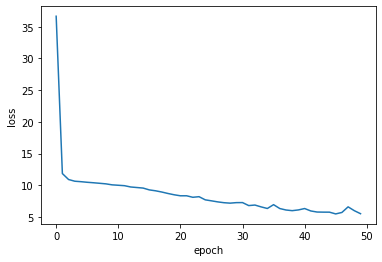

In [51]:
plt.plot(history.history["loss"])
plt.ylabel("loss")
plt.xlabel("epoch")
plt.show()

In [52]:
clustering_probs = clustering_model.predict(x_data, batch_size=batch_size, verbose=1)
cluster_assignments = tf.math.argmax(clustering_probs, axis=-1).numpy()
cluster_confidence = tf.math.reduce_max(clustering_probs, axis=-1).numpy()

120/120 [==============================] - 97s 806ms/step


In [53]:
clusters = defaultdict(list)
for idx, c in enumerate(cluster_assignments):
    clusters[c].append((idx, cluster_confidence[idx]))
for c in range(num_clusters):
    print("cluster", c, ":", len(clusters[c]))

cluster 0 : 3080
cluster 1 : 2010
cluster 2 : 4846
cluster 3 : 2771
cluster 4 : 3457
cluster 5 : 3748
cluster 6 : 2438
cluster 7 : 3431
cluster 8 : 1793
cluster 9 : 2320
cluster 10 : 1925
cluster 11 : 3165
cluster 12 : 3418
cluster 13 : 4540
cluster 14 : 2365
cluster 15 : 2631
cluster 16 : 3651
cluster 17 : 2353
cluster 18 : 2676
cluster 19 : 3382


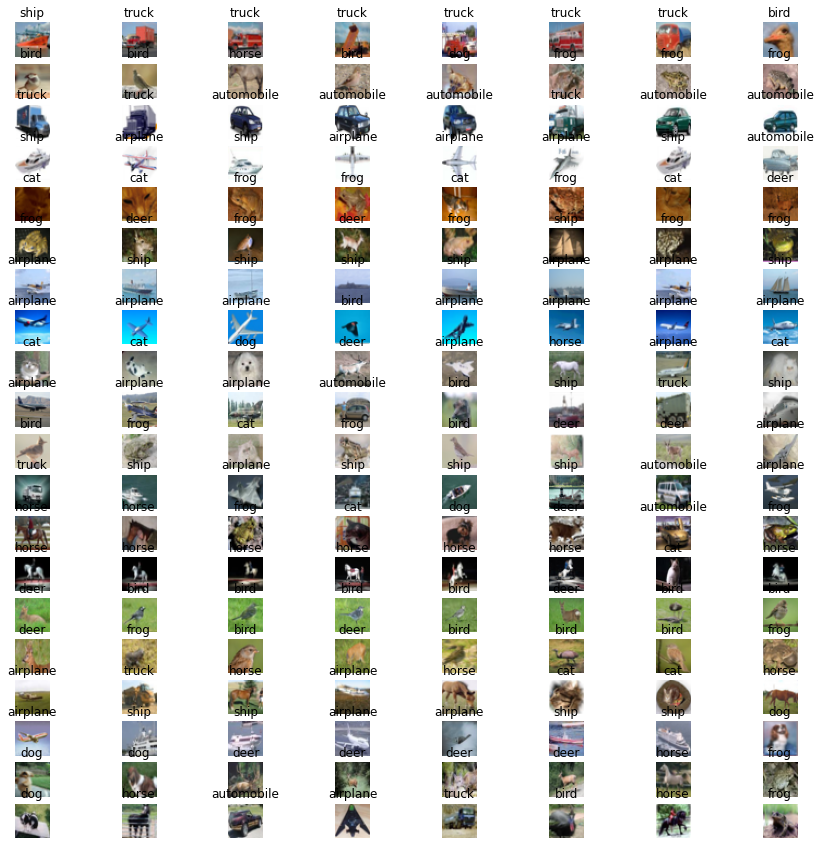

In [54]:
num_images = 8
plt.figure(figsize=(15, 15))
position = 1
for c in range(num_clusters):
    cluster_instances = sorted(clusters[c], key=lambda kv: kv[1], reverse=True)
    for j in range(num_images):
        image_idx = cluster_instances[j][0]
        plt.subplot(num_clusters, num_images, position)
        plt.imshow(x_data[image_idx].astype("uint8"))
        plt.title(classes[y_data[image_idx][0]])
        plt.axis("off")
        position += 1

In [55]:
cluster_label_counts = dict()
for c in range(num_clusters):
    cluster_label_counts[c] = [0] * num_classes
    instances = clusters[c]
    for i, _ in instances:
        cluster_label_counts[c][y_data[i][0]] += 1
    cluster_label_idx = np.argmax(cluster_label_counts[c])
    correct_count = np.max(cluster_label_counts[c])
    cluster_size = len(clusters[c])
    accuracy = (np.round((correct_count / cluster_size) * 100, 2) if cluster_size > 0 else 0)
    cluster_label = classes[cluster_label_idx]
    print("cluster", c, "label is:", cluster_label, "- accuracy:", accuracy, "%")

cluster 0 label is: truck - accuracy: 28.51 %
cluster 1 label is: frog - accuracy: 20.15 %
cluster 2 label is: truck - accuracy: 28.72 %
cluster 3 label is: airplane - accuracy: 29.59 %
cluster 4 label is: frog - accuracy: 29.1 %
cluster 5 label is: frog - accuracy: 23.48 %
cluster 6 label is: ship - accuracy: 37.28 %
cluster 7 label is: airplane - accuracy: 37.13 %
cluster 8 label is: dog - accuracy: 20.47 %
cluster 9 label is: truck - accuracy: 21.94 %
cluster 10 label is: bird - accuracy: 21.71 %
cluster 11 label is: automobile - accuracy: 26.79 %
cluster 12 label is: horse - accuracy: 18.11 %
cluster 13 label is: dog - accuracy: 21.72 %
cluster 14 label is: deer - accuracy: 32.3 %
cluster 15 label is: frog - accuracy: 29.61 %
cluster 16 label is: horse - accuracy: 26.08 %
cluster 17 label is: ship - accuracy: 27.07 %
cluster 18 label is: deer - accuracy: 18.95 %
cluster 19 label is: horse - accuracy: 15.14 %


# Project 33

In [1]:
import math
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import keras
from tensorflow.keras import layers

In [2]:
unlabeled_dataset_size = 100000
labeled_dataset_size = 5000
image_size = 96
image_channels = 3

num_epochs = 20
batch_size = 525
width = 128
temperature = 0.1

contrastive_augmentation = {"min_area":0.25, "brightness":0.6, "jitter":0.2}
classification_augmentation = {"min_area":0.75, "brightness":0.3, "jitter":0.1}

In [7]:
def prepare_dataset():
    steps_per_epoch = (unlabeled_dataset_size + labeled_dataset_size) // batch_size
    unlabeled_batch_size = unlabeled_dataset_size // steps_per_epoch
    labeled_batch_size = labeled_dataset_size // steps_per_epoch
    print(f"Batch size is {unlabeled_batch_size} (unlabeled) + {labeled_batch_size} (labeled)")
    unlabeled_train_dataset = (tfds.load("stl10", split="unlabelled", as_supervised=True, shuffle_files = True)
                              .shuffle(buffer_size=10 * unlabeled_batch_size)
                              .batch(unlabeled_batch_size))
    labeled_train_dataset = (tfds.load("stl10", split="train", as_supervised=True, shuffle_files=True)
                            .shuffle(buffer_size=10 * labeled_batch_size)
                            .batch(labeled_batch_size))
    test_dataset = (tfds.load("stl10", split="test", as_supervised=True)
                   .batch(batch_size)
                   .prefetch(buffer_size=tf.data.AUTOTUNE))
    train_dataset = tf.data.Dataset.zip((unlabeled_train_dataset, labeled_train_dataset)
                                       ).prefetch(buffer_size=tf.data.AUTOTUNE)
    return train_dataset, labeled_train_dataset, test_dataset
train_dataset, labeled_train_dataset, test_dataset = prepare_dataset()

Batch size is 500 (unlabeled) + 25 (labeled)


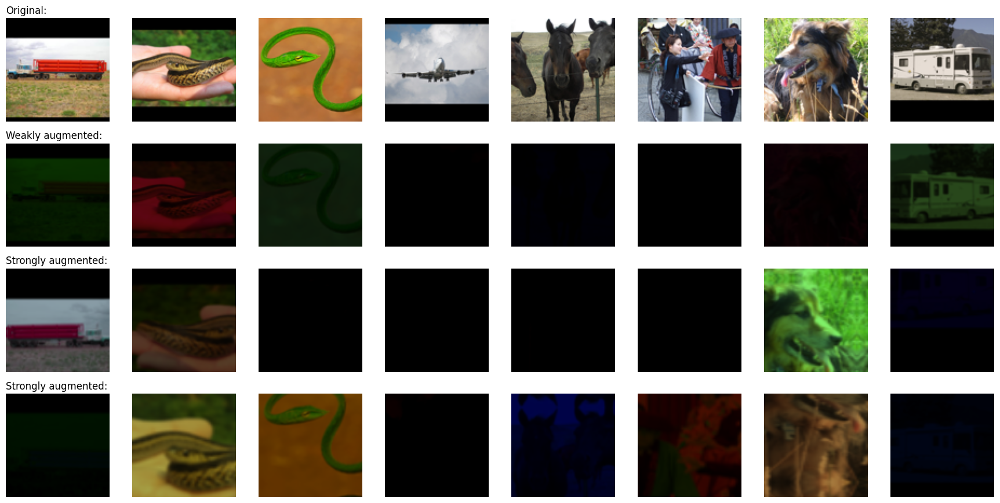

In [8]:
class RandomColorAffine(layers.Layer):
    def __init__(self, brightness=0, jitter=0, **kwargs):
        super().__init__(**kwargs)
        self.brightness = brightness
        self.jitter = jitter
    def get_config(self):
        config = super().get_config()
        config.update({"brightness":self.brightness, "jitter":self.jitter})
        return config
    def call(self, images, training=True):
        if training:
            batch_size = tf.shape(images)[0]
            brightness_scales = 1 * tf.random.uniform((batch_size, 1, 1, 1), minval=-self.brightness, 
                                                      maxval=self.brightness)
            jitter_matrices = tf.random.uniform((batch_size, 1, 3, 3), minval=-self.jitter, maxval=self.jitter)
            color_transforms = (tf.eye(3, batch_shape=[batch_size, 1]) * brightness_scales + jitter_matrices)
            images = tf.clip_by_value(tf.matmul(images, color_transforms), 0, 1)
        return images
def get_augmenter(min_area, brightness, jitter):
    zoom_factor = 1.0 - math.sqrt(min_area)
    return keras.Sequential([
        keras.Input(shape=(image_size, image_size, image_channels)),
        layers.Rescaling(1 / 255),
        layers.RandomFlip("horizontal"),
        layers.RandomTranslation(zoom_factor / 2, zoom_factor / 2),
        layers.RandomZoom((-zoom_factor, 0.0), (-zoom_factor, 0.0)),
        RandomColorAffine(brightness, jitter),
    ])
def visualize_augmentations(num_images):
    images = next(iter(train_dataset))[0][0][:num_images]
    augmented_images = zip(images, 
                        get_augmenter(**classification_augmentation)(images),
                        get_augmenter(**contrastive_augmentation)(images),
                        get_augmenter(**contrastive_augmentation)(images))
    row_titles = [
            "Original:",
            "Weakly augmented:",
            "Strongly augmented:",
            "Strongly augmented:",
    ]
    plt.figure(figsize=(num_images * 2.2, 4 * 2.2), dpi=100)
    for column, image_row in enumerate(augmented_images):
        for row, image in enumerate(image_row):
            plt.subplot(4, num_images, row * num_images + column + 1)
            plt.imshow(image)
            if column == 0:
                plt.title(row_titles[row], loc="left")
            plt.axis("off")
    plt.tight_layout()

visualize_augmentations(num_images=8)

In [9]:
def get_encoder():
    return keras.Sequential([
        keras.Input(shape=(image_size, image_size, image_channels)),
        layers.Conv2D(width, kernel_size=3, strides=2, activation="relu"),
        layers.Conv2D(width, kernel_size=3, strides=2, activation="relu"),
        layers.Conv2D(width, kernel_size=3, strides=2, activation="relu"),
        layers.Conv2D(width, kernel_size=3, strides=2, activation="relu"),
        layers.Flatten(),
        layers.Dense(width, activation="relu"),
    ], name="encoder",)

In [11]:
baseline_model = keras.Sequential([
    keras.Input(shape=(image_size, image_size, image_channels)),
    get_augmenter(**classification_augmentation),
    get_encoder(),
    layers.Dense(10),
], name="baseline_model")
baseline_model.compile(optimizer=keras.optimizers.Adam(), 
                       loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                      metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc")])
baseline_history = baseline_model.fit(labeled_train_dataset, epochs=num_epochs, validation_data=test_dataset)
print("Maximum validated accuracy: {:.2f}%".format(max(baseline_history.history["val_acc"]) * 100))

Epoch 1/20
200/200 [==============================] - 83s 404ms/step - loss: 2.3029 - acc: 0.1000 - val_loss: 2.2953 - val_acc: 0.1695
Epoch 2/20
200/200 [==============================] - 79s 395ms/step - loss: 2.3036 - acc: 0.0946 - val_loss: 2.2719 - val_acc: 0.1091
Epoch 3/20
200/200 [==============================] - 79s 396ms/step - loss: 2.2581 - acc: 0.1284 - val_loss: 3.1258 - val_acc: 0.1804
Epoch 4/20
200/200 [==============================] - 79s 396ms/step - loss: 2.1682 - acc: 0.1628 - val_loss: 2.7098 - val_acc: 0.2529
Epoch 5/20
200/200 [==============================] - 80s 398ms/step - loss: 2.1159 - acc: 0.1970 - val_loss: 2.3668 - val_acc: 0.2740
Epoch 6/20
200/200 [==============================] - 81s 403ms/step - loss: 2.0749 - acc: 0.2078 - val_loss: 3.6578 - val_acc: 0.2766
Epoch 7/20
200/200 [==============================] - 80s 398ms/step - loss: 2.0237 - acc: 0.2334 - val_loss: 2.2411 - val_acc: 0.3186
Epoch 8/20
200/200 [==============================] - 8

In [15]:
# Define the contrastive model with model-subclassing
class ContrastiveModel(keras.Model):
    def __init__(self):
        super().__init__()

        self.temperature = temperature
        self.contrastive_augmenter = get_augmenter(**contrastive_augmentation)
        self.classification_augmenter = get_augmenter(**classification_augmentation)
        self.encoder = get_encoder()
        # Non-linear MLP as projection head
        self.projection_head = keras.Sequential(
            [
                keras.Input(shape=(width,)),
                layers.Dense(width, activation="relu"),
                layers.Dense(width),
            ],
            name="projection_head",
        )
        # Single dense layer for linear probing
        self.linear_probe = keras.Sequential(
            [layers.Input(shape=(width,)), layers.Dense(10)], name="linear_probe"
        )

        self.encoder.summary()
        self.projection_head.summary()
        self.linear_probe.summary()

    def compile(self, contrastive_optimizer, probe_optimizer, **kwargs):
        super().compile(**kwargs)

        self.contrastive_optimizer = contrastive_optimizer
        self.probe_optimizer = probe_optimizer

        # self.contrastive_loss will be defined as a method
        self.probe_loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True)

        self.contrastive_loss_tracker = keras.metrics.Mean(name="c_loss")
        self.contrastive_accuracy = keras.metrics.SparseCategoricalAccuracy(
            name="c_acc"
        )
        self.probe_loss_tracker = keras.metrics.Mean(name="p_loss")
        self.probe_accuracy = keras.metrics.SparseCategoricalAccuracy(name="p_acc")

    @property
    def metrics(self):
        return [
            self.contrastive_loss_tracker,
            self.contrastive_accuracy,
            self.probe_loss_tracker,
            self.probe_accuracy,
        ]

    def contrastive_loss(self, projections_1, projections_2):
        # InfoNCE loss (information noise-contrastive estimation)
        # NT-Xent loss (normalized temperature-scaled cross entropy)

        # Cosine similarity: the dot product of the l2-normalized feature vectors
        projections_1 = tf.math.l2_normalize(projections_1, axis=1)
        projections_2 = tf.math.l2_normalize(projections_2, axis=1)
        similarities = (
            tf.matmul(projections_1, projections_2, transpose_b=True) / self.temperature
        )

        # The similarity between the representations of two augmented views of the
        # same image should be higher than their similarity with other views
        batch_size = tf.shape(projections_1)[0]
        contrastive_labels = tf.range(batch_size)
        self.contrastive_accuracy.update_state(contrastive_labels, similarities)
        self.contrastive_accuracy.update_state(
            contrastive_labels, tf.transpose(similarities)
        )

        # The temperature-scaled similarities are used as logits for cross-entropy
        # a symmetrized version of the loss is used here
        loss_1_2 = keras.losses.sparse_categorical_crossentropy(
            contrastive_labels, similarities, from_logits=True
        )
        loss_2_1 = keras.losses.sparse_categorical_crossentropy(
            contrastive_labels, tf.transpose(similarities), from_logits=True
        )
        return (loss_1_2 + loss_2_1) / 2

    def train_step(self, data):
        (unlabeled_images, _), (labeled_images, labels) = data

        # Both labeled and unlabeled images are used, without labels
        images = tf.concat((unlabeled_images, labeled_images), axis=0)
        # Each image is augmented twice, differently
        augmented_images_1 = self.contrastive_augmenter(images, training=True)
        augmented_images_2 = self.contrastive_augmenter(images, training=True)
        with tf.GradientTape() as tape:
            features_1 = self.encoder(augmented_images_1, training=True)
            features_2 = self.encoder(augmented_images_2, training=True)
            # The representations are passed through a projection mlp
            projections_1 = self.projection_head(features_1, training=True)
            projections_2 = self.projection_head(features_2, training=True)
            contrastive_loss = self.contrastive_loss(projections_1, projections_2)
        gradients = tape.gradient(
            contrastive_loss,
            self.encoder.trainable_weights + self.projection_head.trainable_weights,
        )
        self.contrastive_optimizer.apply_gradients(
            zip(
                gradients,
                self.encoder.trainable_weights + self.projection_head.trainable_weights,
            )
        )
        self.contrastive_loss_tracker.update_state(contrastive_loss)

        # Labels are only used in evalutation for an on-the-fly logistic regression
        preprocessed_images = self.classification_augmenter(
            labeled_images, training=True
        )
        with tf.GradientTape() as tape:
            # the encoder is used in inference mode here to avoid regularization
            # and updating the batch normalization paramers if they are used
            features = self.encoder(preprocessed_images, training=False)
            class_logits = self.linear_probe(features, training=True)
            probe_loss = self.probe_loss(labels, class_logits)
        gradients = tape.gradient(probe_loss, self.linear_probe.trainable_weights)
        self.probe_optimizer.apply_gradients(
            zip(gradients, self.linear_probe.trainable_weights)
        )
        self.probe_loss_tracker.update_state(probe_loss)
        self.probe_accuracy.update_state(labels, class_logits)

        return {m.name: m.result() for m in self.metrics}

    def test_step(self, data):
        labeled_images, labels = data

        # For testing the components are used with a training=False flag
        preprocessed_images = self.classification_augmenter(
            labeled_images, training=False
        )
        features = self.encoder(preprocessed_images, training=False)
        class_logits = self.linear_probe(features, training=False)
        probe_loss = self.probe_loss(labels, class_logits)
        self.probe_loss_tracker.update_state(probe_loss)
        self.probe_accuracy.update_state(labels, class_logits)

        # Only the probe metrics are logged at test time
        return {m.name: m.result() for m in self.metrics[2:]}


# Contrastive pretraining
pretraining_model = ContrastiveModel()
pretraining_model.compile(
    contrastive_optimizer=keras.optimizers.Adam(),
    probe_optimizer=keras.optimizers.Adam(),
)

pretraining_history = pretraining_model.fit(
    train_dataset, epochs=num_epochs, validation_data=test_dataset
)
print(
    "Maximal validation accuracy: {:.2f}%".format(
        max(pretraining_history.history["val_p_acc"]) * 100
    )
)

Model: "encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 47, 47, 128)       3584      
                                                                 
 conv2d_17 (Conv2D)          (None, 23, 23, 128)       147584    
                                                                 
 conv2d_18 (Conv2D)          (None, 11, 11, 128)       147584    
                                                                 
 conv2d_19 (Conv2D)          (None, 5, 5, 128)         147584    
                                                                 
 flatten_4 (Flatten)         (None, 3200)              0         
                                                                 
 dense_12 (Dense)            (None, 128)               409728    
                                                                 
Total params: 856,064
Trainable params: 856,064
Non-trainab

In [16]:
finetuning_model = keras.Sequential([
    layers.Input(shape=(image_size, image_size, image_channels)),
    get_augmenter(**classification_augmentation),
    pretraining_model.encoder,
    layers.Dense(10),
], name="finetuning_model")
finetuning_model.compile(optimizer=keras.optimizers.Adam(), 
                         loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                        metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc")],)
finetuning_history = finetuning_model.fit(labeled_train_dataset, epochs=num_epochs, validation_data=test_dataset)
print("Maximal validation accuracy: {:.2f}".format(max(finetuning_history.history["val_acc"]) * 100))

Epoch 1/20
200/200 [==============================] - 59s 290ms/step - loss: 2.2963 - acc: 0.2058 - val_loss: 4.4317 - val_acc: 0.3119
Epoch 2/20
200/200 [==============================] - 58s 288ms/step - loss: 1.9939 - acc: 0.2604 - val_loss: 3.1880 - val_acc: 0.3836
Epoch 3/20
200/200 [==============================] - 57s 287ms/step - loss: 1.8960 - acc: 0.2882 - val_loss: 2.9837 - val_acc: 0.4404
Epoch 4/20
200/200 [==============================] - 58s 288ms/step - loss: 1.8309 - acc: 0.3102 - val_loss: 2.8782 - val_acc: 0.4314
Epoch 5/20
200/200 [==============================] - 57s 286ms/step - loss: 1.7955 - acc: 0.3336 - val_loss: 3.2102 - val_acc: 0.4150
Epoch 6/20
200/200 [==============================] - 57s 286ms/step - loss: 1.7678 - acc: 0.3332 - val_loss: 2.4966 - val_acc: 0.4411
Epoch 7/20
200/200 [==============================] - 57s 286ms/step - loss: 1.7349 - acc: 0.3544 - val_loss: 3.0680 - val_acc: 0.4316
Epoch 8/20
200/200 [==============================] - 5

# Project 34

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa
SEED = 42
keras.utils.set_random_seed(SEED)

C:\Users\jatin\anaconda3\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.5.0 and strictly below 2.8.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.8.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  warnings.warn(


In [44]:
class Config(object):
    # DATA
    batch_size = 256
    buffer_size = batch_size * 2
    input_shape = (32, 32, 3)
    num_classes = 10

    # AUGMENTATION
    image_size = 48

    # ARCHITECTURE
    patch_size = 4
    projected_dim = 96
    num_shift_blocks_per_stages = [2, 4, 8, 2]
    epsilon = 1e-5
    stochastic_depth_rate = 0.2
    mlp_dropout_rate = 0.2
    num_div = 12
    shift_pixel = 1
    mlp_expand_ratio = 2

    # OPTIMIZER
    lr_start = 1e-5
    lr_max = 1e-3
    weight_decay = 1e-4

    # TRAINING
    epochs = 100


config = Config()

In [45]:
(x_train, y_train), (x_test, y_test) = keras.datasets.cifar10.load_data()
(x_train, y_train), (x_val, y_val) = (
    (x_train[:40000], y_train[:40000]),
    (x_train[40000:], y_train[40000:]),
)
print(f"Training samples: {len(x_train)}")
print(f"Validation samples: {len(x_val)}")
print(f"Testing samples: {len(x_test)}")

AUTO = tf.data.AUTOTUNE
train_ds = tf.data.Dataset.from_tensor_slices((x_train, y_train))
train_ds = train_ds.shuffle(config.buffer_size).batch(config.batch_size).prefetch(AUTO)

val_ds = tf.data.Dataset.from_tensor_slices((x_val, y_val))
val_ds = val_ds.batch(config.batch_size).prefetch(AUTO)

test_ds = tf.data.Dataset.from_tensor_slices((x_test, y_test))
test_ds = test_ds.batch(config.batch_size).prefetch(AUTO)

Training samples: 40000
Validation samples: 10000
Testing samples: 10000


In [46]:
def get_augmentation_model():
    """Build the data augmentation model."""
    data_augmentation = keras.Sequential(
        [
            layers.Resizing(config.input_shape[0] + 20, config.input_shape[0] + 20),
            layers.RandomCrop(config.image_size, config.image_size),
            layers.RandomFlip("horizontal"),
            layers.Rescaling(1 / 255.0),
        ]
    )
    return data_augmentation

In [47]:
class MLP(layers.Layer):
    """Get the MLP layer for each shift block.

    Args:
        mlp_expand_ratio (int): The ratio with which the first feature map is expanded.
        mlp_dropout_rate (float): The rate for dropout.
    """

    def __init__(self, mlp_expand_ratio, mlp_dropout_rate, **kwargs):
        super().__init__(**kwargs)
        self.mlp_expand_ratio = mlp_expand_ratio
        self.mlp_dropout_rate = mlp_dropout_rate

    def build(self, input_shape):
        input_channels = input_shape[-1]
        initial_filters = int(self.mlp_expand_ratio * input_channels)

        self.mlp = keras.Sequential(
            [
                layers.Dense(units=initial_filters, activation=tf.nn.gelu,),
                layers.Dropout(rate=self.mlp_dropout_rate),
                layers.Dense(units=input_channels),
                layers.Dropout(rate=self.mlp_dropout_rate),
            ]
        )

    def call(self, x):
        x = self.mlp(x)
        return x

In [48]:
class DropPath(layers.Layer):
    """Drop Path also known as the Stochastic Depth layer.

    Refernece:
        - https://keras.io/examples/vision/cct/#stochastic-depth-for-regularization
        - github.com:rwightman/pytorch-image-models
    """

    def __init__(self, drop_path_prob, **kwargs):
        super().__init__(**kwargs)
        self.drop_path_prob = drop_path_prob

    def call(self, x, training=False):
        if training:
            keep_prob = 1 - self.drop_path_prob
            shape = (tf.shape(x)[0],) + (1,) * (len(tf.shape(x)) - 1)
            random_tensor = keep_prob + tf.random.uniform(shape, 0, 1)
            random_tensor = tf.floor(random_tensor)
            return (x / keep_prob) * random_tensor
        return x

In [49]:
class ShiftViTBlock(layers.Layer):
    """A unit ShiftViT Block

    Args:
        shift_pixel (int): The number of pixels to shift. Default to 1.
        mlp_expand_ratio (int): The ratio with which MLP features are
            expanded. Default to 2.
        mlp_dropout_rate (float): The dropout rate used in MLP.
        num_div (int): The number of divisions of the feature map's channel.
            Totally, 4/num_div of channels will be shifted. Defaults to 12.
        epsilon (float): Epsilon constant.
        drop_path_prob (float): The drop probability for drop path.
    """

    def __init__(
        self,
        epsilon,
        drop_path_prob,
        mlp_dropout_rate,
        num_div=12,
        shift_pixel=1,
        mlp_expand_ratio=2,
        **kwargs,
    ):
        super().__init__(**kwargs)
        self.shift_pixel = shift_pixel
        self.mlp_expand_ratio = mlp_expand_ratio
        self.mlp_dropout_rate = mlp_dropout_rate
        self.num_div = num_div
        self.epsilon = epsilon
        self.drop_path_prob = drop_path_prob

    def build(self, input_shape):
        self.H = input_shape[1]
        self.W = input_shape[2]
        self.C = input_shape[3]
        self.layer_norm = layers.LayerNormalization(epsilon=self.epsilon)
        self.drop_path = (
            DropPath(drop_path_prob=self.drop_path_prob)
            if self.drop_path_prob > 0.0
            else layers.Activation("linear")
        )
        self.mlp = MLP(
            mlp_expand_ratio=self.mlp_expand_ratio,
            mlp_dropout_rate=self.mlp_dropout_rate,
        )

    def get_shift_pad(self, x, mode):
        """Shifts the channels according to the mode chosen."""
        if mode == "left":
            offset_height = 0
            offset_width = 0
            target_height = 0
            target_width = self.shift_pixel
        elif mode == "right":
            offset_height = 0
            offset_width = self.shift_pixel
            target_height = 0
            target_width = self.shift_pixel
        elif mode == "up":
            offset_height = 0
            offset_width = 0
            target_height = self.shift_pixel
            target_width = 0
        else:
            offset_height = self.shift_pixel
            offset_width = 0
            target_height = self.shift_pixel
            target_width = 0
        crop = tf.image.crop_to_bounding_box(
            x,
            offset_height=offset_height,
            offset_width=offset_width,
            target_height=self.H - target_height,
            target_width=self.W - target_width,
        )
        shift_pad = tf.image.pad_to_bounding_box(
            crop,
            offset_height=offset_height,
            offset_width=offset_width,
            target_height=self.H,
            target_width=self.W,
        )
        return shift_pad

    def call(self, x, training=False):
        # Split the feature maps
        x_splits = tf.split(x, num_or_size_splits=self.C // self.num_div, axis=-1)

        # Shift the feature maps
        x_splits[0] = self.get_shift_pad(x_splits[0], mode="left")
        x_splits[1] = self.get_shift_pad(x_splits[1], mode="right")
        x_splits[2] = self.get_shift_pad(x_splits[2], mode="up")
        x_splits[3] = self.get_shift_pad(x_splits[3], mode="down")

        # Concatenate the shifted and unshifted feature maps
        x = tf.concat(x_splits, axis=-1)

        # Add the residual connection
        shortcut = x
        x = shortcut + self.drop_path(self.mlp(self.layer_norm(x)), training=training)
        return x

In [50]:
class PatchMerging(layers.Layer):
    """The Patch Merging layer.

    Args:
        epsilon (float): The epsilon constant.
    """

    def __init__(self, epsilon, **kwargs):
        super().__init__(**kwargs)
        self.epsilon = epsilon

    def build(self, input_shape):
        filters = 2 * input_shape[-1]
        self.reduction = layers.Conv2D(
            filters=filters, kernel_size=2, strides=2, padding="same", use_bias=False
        )
        self.layer_norm = layers.LayerNormalization(epsilon=self.epsilon)

    def call(self, x):
        # Apply the patch merging algorithm on the feature maps
        x = self.layer_norm(x)
        x = self.reduction(x)
        return x

In [51]:
# Note: This layer will have a different depth of stacking
# for different stages on the model.
class StackedShiftBlocks(layers.Layer):
    """The layer containing stacked ShiftViTBlocks.

    Args:
        epsilon (float): The epsilon constant.
        mlp_dropout_rate (float): The dropout rate used in the MLP block.
        num_shift_blocks (int): The number of shift vit blocks for this stage.
        stochastic_depth_rate (float): The maximum drop path rate chosen.
        is_merge (boolean): A flag that determines the use of the Patch Merge
            layer after the shift vit blocks.
        num_div (int): The division of channels of the feature map. Defaults to 12.
        shift_pixel (int): The number of pixels to shift. Defaults to 1.
        mlp_expand_ratio (int): The ratio with which the initial dense layer of
            the MLP is expanded Defaults to 2.
    """

    def __init__(
        self,
        epsilon,
        mlp_dropout_rate,
        num_shift_blocks,
        stochastic_depth_rate,
        is_merge,
        num_div=12,
        shift_pixel=1,
        mlp_expand_ratio=2,
        **kwargs,
    ):
        super().__init__(**kwargs)
        self.epsilon = epsilon
        self.mlp_dropout_rate = mlp_dropout_rate
        self.num_shift_blocks = num_shift_blocks
        self.stochastic_depth_rate = stochastic_depth_rate
        self.is_merge = is_merge
        self.num_div = num_div
        self.shift_pixel = shift_pixel
        self.mlp_expand_ratio = mlp_expand_ratio

    def build(self, input_shapes):
        # Calculate stochastic depth probabilities.
        # Reference: https://keras.io/examples/vision/cct/#the-final-cct-model
        dpr = [
            x
            for x in np.linspace(
                start=0, stop=self.stochastic_depth_rate, num=self.num_shift_blocks
            )
        ]

        # Build the shift blocks as a list of ShiftViT Blocks
        self.shift_blocks = list()
        for num in range(self.num_shift_blocks):
            self.shift_blocks.append(
                ShiftViTBlock(
                    num_div=self.num_div,
                    epsilon=self.epsilon,
                    drop_path_prob=dpr[num],
                    mlp_dropout_rate=self.mlp_dropout_rate,
                    shift_pixel=self.shift_pixel,
                    mlp_expand_ratio=self.mlp_expand_ratio,
                )
            )
        if self.is_merge:
            self.patch_merge = PatchMerging(epsilon=self.epsilon)

    def call(self, x, training=False):
        for shift_block in self.shift_blocks:
            x = shift_block(x, training=training)
        if self.is_merge:
            x = self.patch_merge(x)
        return x

In [52]:
class ShiftViTModel(keras.Model):
    """The ShiftViT Model.

    Args:
        data_augmentation (keras.Model): A data augmentation model.
        projected_dim (int): The dimension to which the patches of the image are
            projected.
        patch_size (int): The patch size of the images.
        num_shift_blocks_per_stages (list[int]): A list of all the number of shit
            blocks per stage.
        epsilon (float): The epsilon constant.
        mlp_dropout_rate (float): The dropout rate used in the MLP block.
        stochastic_depth_rate (float): The maximum drop rate probability.
        num_div (int): The number of divisions of the channesl of the feature
            map. Defaults to 12.
        shift_pixel (int): The number of pixel to shift. Default to 1.
        mlp_expand_ratio (int): The ratio with which the initial mlp dense layer
            is expanded to. Defaults to 2.
    """

    def __init__(
        self,
        data_augmentation,
        projected_dim,
        patch_size,
        num_shift_blocks_per_stages,
        epsilon,
        mlp_dropout_rate,
        stochastic_depth_rate,
        num_div=12,
        shift_pixel=1,
        mlp_expand_ratio=2,
        **kwargs,
    ):
        super().__init__(**kwargs)
        self.data_augmentation = data_augmentation
        self.patch_projection = layers.Conv2D(
            filters=projected_dim,
            kernel_size=patch_size,
            strides=patch_size,
            padding="same",
        )
        self.stages = list()
        for index, num_shift_blocks in enumerate(num_shift_blocks_per_stages):
            if index == len(num_shift_blocks_per_stages) - 1:
                # This is the last stage, do not use the patch merge here.
                is_merge = False
            else:
                is_merge = True
            # Build the stages.
            self.stages.append(
                StackedShiftBlocks(
                    epsilon=epsilon,
                    mlp_dropout_rate=mlp_dropout_rate,
                    num_shift_blocks=num_shift_blocks,
                    stochastic_depth_rate=stochastic_depth_rate,
                    is_merge=is_merge,
                    num_div=num_div,
                    shift_pixel=shift_pixel,
                    mlp_expand_ratio=mlp_expand_ratio,
                )
            )
        self.global_avg_pool = layers.GlobalAveragePooling2D()

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "data_augmentation": self.data_augmentation,
                "patch_projection": self.patch_projection,
                "stages": self.stages,
                "global_avg_pool": self.global_avg_pool,
            }
        )
        return config

    def _calculate_loss(self, data, training=False):
        (images, labels) = data

        # Augment the images
        augmented_images = self.data_augmentation(images, training=training)

        # Create patches and project the pathces.
        projected_patches = self.patch_projection(augmented_images)

        # Pass through the stages
        x = projected_patches
        for stage in self.stages:
            x = stage(x, training=training)

        # Get the logits.
        logits = self.global_avg_pool(x)

        # Calculate the loss and return it.
        total_loss = self.compiled_loss(labels, logits)
        return total_loss, labels, logits

    def train_step(self, inputs):
        with tf.GradientTape() as tape:
            total_loss, labels, logits = self._calculate_loss(
                data=inputs, training=True
            )

        # Apply gradients.
        train_vars = [
            self.data_augmentation.trainable_variables,
            self.patch_projection.trainable_variables,
            self.global_avg_pool.trainable_variables,
        ]
        train_vars = train_vars + [stage.trainable_variables for stage in self.stages]

        # Optimize the gradients.
        grads = tape.gradient(total_loss, train_vars)
        trainable_variable_list = []
        for (grad, var) in zip(grads, train_vars):
            for g, v in zip(grad, var):
                trainable_variable_list.append((g, v))
        self.optimizer.apply_gradients(trainable_variable_list)

        # Update the metrics
        self.compiled_metrics.update_state(labels, logits)
        return {m.name: m.result() for m in self.metrics}

    def test_step(self, data):
        _, labels, logits = self._calculate_loss(data=data, training=False)

        # Update the metrics
        self.compiled_metrics.update_state(labels, logits)
        return {m.name: m.result() for m in self.metrics}

In [53]:
model = ShiftViTModel(
    data_augmentation=get_augmentation_model(),
    projected_dim=config.projected_dim,
    patch_size=config.patch_size,
    num_shift_blocks_per_stages=config.num_shift_blocks_per_stages,
    epsilon=config.epsilon,
    mlp_dropout_rate=config.mlp_dropout_rate,
    stochastic_depth_rate=config.stochastic_depth_rate,
    num_div=config.num_div,
    shift_pixel=config.shift_pixel,
    mlp_expand_ratio=config.mlp_expand_ratio,
)

In [54]:
# Some code is taken from:
# https://www.kaggle.com/ashusma/training-rfcx-tensorflow-tpu-effnet-b2.
class WarmUpCosine(keras.optimizers.schedules.LearningRateSchedule):
    """A LearningRateSchedule that uses a warmup cosine decay schedule."""

    def __init__(self, lr_start, lr_max, warmup_steps, total_steps):
        """
        Args:
            lr_start: The initial learning rate
            lr_max: The maximum learning rate to which lr should increase to in
                the warmup steps
            warmup_steps: The number of steps for which the model warms up
            total_steps: The total number of steps for the model training
        """
        super().__init__()
        self.lr_start = lr_start
        self.lr_max = lr_max
        self.warmup_steps = warmup_steps
        self.total_steps = total_steps
        self.pi = tf.constant(np.pi)

    def __call__(self, step):
        # Check whether the total number of steps is larger than the warmup
        # steps. If not, then throw a value error.
        if self.total_steps < self.warmup_steps:
            raise ValueError(
                f"Total number of steps {self.total_steps} must be"
                + f"larger or equal to warmup steps {self.warmup_steps}."
            )

        # `cos_annealed_lr` is a graph that increases to 1 from the initial
        # step to the warmup step. After that this graph decays to -1 at the
        # final step mark.
        cos_annealed_lr = tf.cos(
            self.pi
            * (tf.cast(step, tf.float32) - self.warmup_steps)
            / tf.cast(self.total_steps - self.warmup_steps, tf.float32)
        )

        # Shift the mean of the `cos_annealed_lr` graph to 1. Now the grpah goes
        # from 0 to 2. Normalize the graph with 0.5 so that now it goes from 0
        # to 1. With the normalized graph we scale it with `lr_max` such that
        # it goes from 0 to `lr_max`
        learning_rate = 0.5 * self.lr_max * (1 + cos_annealed_lr)

        # Check whether warmup_steps is more than 0.
        if self.warmup_steps > 0:
            # Check whether lr_max is larger that lr_start. If not, throw a value
            # error.
            if self.lr_max < self.lr_start:
                raise ValueError(
                    f"lr_start {self.lr_start} must be smaller or"
                    + f"equal to lr_max {self.lr_max}."
                )

            # Calculate the slope with which the learning rate should increase
            # in the warumup schedule. The formula for slope is m = ((b-a)/steps)
            slope = (self.lr_max - self.lr_start) / self.warmup_steps

            # With the formula for a straight line (y = mx+c) build the warmup
            # schedule
            warmup_rate = slope * tf.cast(step, tf.float32) + self.lr_start

            # When the current step is lesser that warmup steps, get the line
            # graph. When the current step is greater than the warmup steps, get
            # the scaled cos graph.
            learning_rate = tf.where(
                step < self.warmup_steps, warmup_rate, learning_rate
            )

        # When the current step is more that the total steps, return 0 else return
        # the calculated graph.
        return tf.where(
            step > self.total_steps, 0.0, learning_rate, name="learning_rate"
        )

In [55]:
# Get the total number of steps for training.
total_steps = int((len(x_train) / config.batch_size) * config.epochs)

# Calculate the number of steps for warmup.
warmup_epoch_percentage = 0.15
warmup_steps = int(total_steps * warmup_epoch_percentage)

# Initialize the warmupcosine schedule.
scheduled_lrs = WarmUpCosine(
    lr_start=1e-5, lr_max=1e-3, warmup_steps=warmup_steps, total_steps=total_steps,
)

# Get the optimizer.
optimizer = tfa.optimizers.AdamW(
    learning_rate=scheduled_lrs, weight_decay=config.weight_decay
)

# Compile and pretrain the model.
model.compile(
    optimizer=optimizer,
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=[
        keras.metrics.SparseCategoricalAccuracy(name="accuracy"),
        keras.metrics.SparseTopKCategoricalAccuracy(5, name="top-5-accuracy"),
    ],
)

# Train the model
history = model.fit(
    train_ds,
    epochs=config.epochs,
    validation_data=val_ds,
    callbacks=[
        keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=5, mode="auto",)
    ],
)

# Evaluate the model with the test dataset.
print("TESTING")
loss, acc_top1, acc_top5 = model.evaluate(test_ds)
print(f"Loss: {loss:0.2f}")
print(f"Top 1 test accuracy: {acc_top1*100:0.2f}%")
print(f"Top 5 test accuracy: {acc_top5*100:0.2f}%")

Epoch 1/100
157/157 [==============================] - 669s 4s/step - loss: 3.3074 - accuracy: 0.1015 - top-5-accuracy: 0.4593 - val_loss: 2.1895 - val_accuracy: 0.1744 - val_top-5-accuracy: 0.6780
Epoch 2/100
157/157 [==============================] - 660s 4s/step - loss: 2.2358 - accuracy: 0.2008 - top-5-accuracy: 0.7083 - val_loss: 2.0079 - val_accuracy: 0.3098 - val_top-5-accuracy: 0.7872
Epoch 3/100
157/157 [==============================] - 660s 4s/step - loss: 1.8607 - accuracy: 0.3254 - top-5-accuracy: 0.8442 - val_loss: 1.6549 - val_accuracy: 0.3999 - val_top-5-accuracy: 0.8882
Epoch 4/100
157/157 [==============================] - 661s 4s/step - loss: 1.6466 - accuracy: 0.4024 - top-5-accuracy: 0.8947 - val_loss: 1.5055 - val_accuracy: 0.4597 - val_top-5-accuracy: 0.9102
Epoch 5/100
157/157 [==============================] - 662s 4s/step - loss: 1.5206 - accuracy: 0.4513 - top-5-accuracy: 0.9141 - val_loss: 1.3485 - val_accuracy: 0.5138 - val_top-5-accuracy: 0.9345
Epoch 6/10

# Project 35

In [56]:
import random
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt

In [57]:
epochs = 10 
batch_size = 16
margin = 1

In [58]:
(x_train_val, y_train_val), (x_test, y_test) = keras.datasets.mnist.load_data()
x_train_val = x_train_val.astype("float32")
x_test = x_test.astype("float32")

In [59]:
x_train, x_val = x_train_val[:30000], x_train_val[30000:]
y_train, y_val = y_train_val[:30000], y_train_val[30000:]
del x_train_val, y_train_val

In [60]:
def make_pairs(x, y):
    num_classes = max(y) + 1
    digit_indices = [np.where(y == i)[0] for i in range(num_classes)]
    pairs = []
    labels = []
    for idx1 in range(len(x)):
        x1 = x[idx1]
        label1 = y[idx1]
        idx2 = random.choice(digit_indices[label1])
        x2 = x[idx2]
        
        pairs += [[x1, x2]]
        labels += [1]
        
        label2 = random.randint(0, num_classes - 1)
        while label2 == label1:
            label2 = random.randint(0, num_classes - 1)
        
        idx2 = random.choice(digit_indices[label2])
        x2 = x[idx2]
        
        pairs += [[x1, x2]]
        labels += [0]
    return np.array(pairs), np.array(labels).astype("float32")
pairs_train, labels_train = make_pairs(x_train, y_train)
pairs_val, labels_val = make_pairs(x_val, y_val)
pairs_test, labels_test = make_pairs(x_test, y_test)

In [61]:
x_train_1 = pairs_train[:, 0]
x_train_2 = pairs_train[:, 1]

In [62]:
x_val_1 = pairs_val[:, 0]
x_val_2 = pairs_val[:, 1]

In [63]:
x_test_1 = pairs_test[:, 0]
x_test_2 = pairs_test[:, 1]

In [67]:
def visualize(pairs, labels, to_show=6, num_col=3, predictions=None, test=False):
    num_row = to_show // num_col if to_show // num_col != 0 else 1
    to_show = num_row * num_col
    fog, axes = plt.subplots(num_row, num_col, figsize=(5, 5))
    for i in range(to_show):
        if num_row == 1:
            ax = axes[i % num_col]
        else:
            ax = axes[i // num_col, i % num_col]
        ax.imshow(tf.concat([pairs[i][0], pairs[i][1]], axis=1), cmap="gray")
        ax.set_axis_off()
        if test:
            ax.set_title("True: {} | Pred: {:.5f}".format(labels[i], predictions[i][0]))
        else:
            ax.set_title("Label: {}".format(labels[i]))
    if test:
        plt.tight_layout(rect=(0, 0, 1.9, 1.9), w_pad=0.0)
    else:
        plt.tight_layout(rect=(0, 0, 1.5, 1.5))
    plt.show()

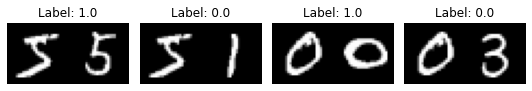

In [68]:
visualize(pairs_train[:-1], labels_train[:-1], to_show=4, num_col=4)

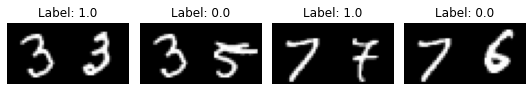

In [69]:
visualize(pairs_val[:-1], labels_val[:-1], to_show=4, num_col=4)

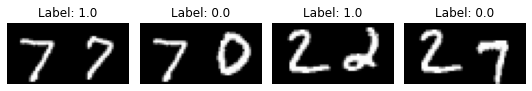

In [70]:
visualize(pairs_test[:-1], labels_test[:-1], to_show=4, num_col=4)

In [71]:
def euclidean_distance(vects):
    x, y = vects
    sum_square = tf.math.reduce_sum(tf.math.square(x - y), axis=1, keepdims=True)
    return tf.math.sqrt(tf.math.maximum(sum_square, tf.keras.backend.epsilon()))

In [74]:
input = layers.Input((28, 28, 1))
x = tf.keras.layers.BatchNormalization()(input)
x = layers.Conv2D(4, (5, 5), activation="tanh")(x)
x = layers.AveragePooling2D(pool_size=(2, 2))(x)
x = layers.Conv2D(16, (5, 5), activation="tanh")(x)
x = layers.AveragePooling2D(pool_size=(2, 2))(x)
x = layers.Flatten()(x)

x = tf.keras.layers.BatchNormalization()(x)
x = layers.Dense(10, activation="tanh")(x)
embedding_network = keras.Model(input, x)

input_1 = layers.Input((28, 28, 1))
input_2 = layers.Input((28, 28, 1))

tower_1 = embedding_network(input_1)
tower_2 = embedding_network(input_2)

merge_layer = layers.Lambda(euclidean_distance)([tower_1, tower_2])
normal_layer = tf.keras.layers.BatchNormalization()(merge_layer)
output_layer = layers.Dense(1, activation="sigmoid")(normal_layer)
siamese = keras.Model(inputs = [input_1, input_2], outputs=output_layer)

In [76]:
def loss(margin=1):
    def contrastive_loss(y_true, y_pred):
        square_pred = tf.math.square(y_pred)
        margin_square = tf.math.square(tf.math.maximum(margin - (y_pred), 0))
        return tf.math.reduce_mean((1 - y_true) * square_pred + (y_true) * margin_square)
    return contrastive_loss

In [77]:
siamese.compile(loss=loss(margin=margin))
siamese.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 input_6 (InputLayer)           [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 model_1 (Functional)           (None, 10)           5318        ['input_5[0][0]',                
                                                                  'input_6[0][0]']                
                                                                                                  
 lambda_1 (Lambda)              (None, 1)            0           ['model_1[0][0]',          

In [79]:
history = siamese.fit([x_train_1, x_train_2], labels_train, 
                      validation_data=([x_val_1, x_val_2], labels_val), batch_size=batch_size, epochs=epochs)

Epoch 1/10
3750/3750 [==============================] - 82s 21ms/step - loss: 0.2516 - val_loss: 0.1542
Epoch 2/10
3750/3750 [==============================] - 78s 21ms/step - loss: 0.0790 - val_loss: 0.0313
Epoch 3/10
3750/3750 [==============================] - 78s 21ms/step - loss: 0.0481 - val_loss: 0.0231
Epoch 4/10
3750/3750 [==============================] - 78s 21ms/step - loss: 0.0403 - val_loss: 0.0195
Epoch 5/10
3750/3750 [==============================] - 78s 21ms/step - loss: 0.0362 - val_loss: 0.0194
Epoch 6/10
3750/3750 [==============================] - 78s 21ms/step - loss: 0.0340 - val_loss: 0.0170
Epoch 7/10
3750/3750 [==============================] - 78s 21ms/step - loss: 0.0314 - val_loss: 0.0150
Epoch 8/10
3750/3750 [==============================] - 79s 21ms/step - loss: 0.0311 - val_loss: 0.0148
Epoch 9/10
3750/3750 [==============================] - 80s 21ms/step - loss: 0.0294 - val_loss: 0.0145
Epoch 10/10
3750/3750 [==============================] - 79s 21m

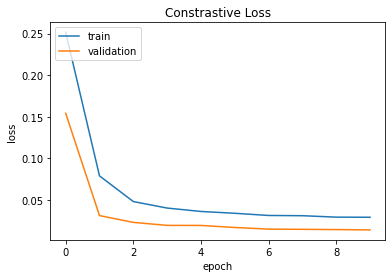

In [83]:
def plt_metric(history, metric, title, has_valid=True):
    plt.plot(history[metric])
    if has_valid:
        plt.plot(history["val_" + metric])
        plt.legend(["train", "validation"], loc="upper left")
    plt.title(title)
    plt.ylabel(metric)
    plt.xlabel("epoch")
    plt.show()
# plt_metric(history=history.history, metric="accuracy", title="Model accuracy")
plt_metric(history=history.history, metric="loss", title="Constrastive Loss")

In [84]:
results = siamese.evaluate([x_test_1, x_test_2], labels_test)
print("test loss, test acc:", results)

625/625 [==============================] - 7s 11ms/step - loss: 0.0123
test loss, test acc: 0.012264994904398918


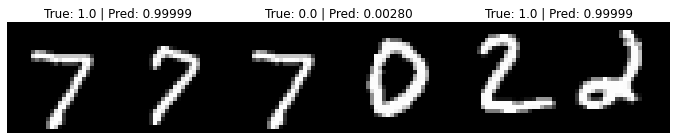

In [85]:
predictions = siamese.predict([x_test_1, x_test_2])
visualize(pairs_test, labels_test, to_show=3, predictions=predictions, test=True)

# Project 36

In [116]:
import tensorflow as tf
import tensorflow_addons as tfa
import numpy as np
from tensorflow import keras
from tensorflow.keras import layers

In [117]:
num_classes = 10
input_shape = (32, 32, 3)
(x_train, y_train), (x_test, y_test) = keras.datasets.cifar10.load_data()
print(f"x_train shape: {x_train.shape} - y_train shape: {y_train.shape}")
print(f"x_test shape: {x_test.shape} - y_test shape: {y_test.shape}")

x_train shape: (50000, 32, 32, 3) - y_train shape: (50000, 1)
x_test shape: (10000, 32, 32, 3) - y_test shape: (10000, 1)


In [119]:
data_augmentation = keras.Sequential([
    layers.Normalization(),
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.02),
    layers.RandomWidth(0.2),
    layers.RandomHeight(0.2)
])
data_augmentation.layers[0].adapt(x_train)

In [127]:
def create_encoder():
    resnet = keras.applications.ResNet50V2(include_top=False, weights=None, input_shape=input_shape, pooling="avg")
    inputs = keras.Input(shape=input_shape)
    augmented = data_augmentation(inputs)
    outputs = resnet(augmented)
    model = keras.Model(inputs=inputs, outputs=outputs, name="cifar10-encoder")
    return model
encoder = create_encoder()
encoder.summary()
learning_rate = 0.001
batch_size = 265
hidden_units = 512
projection_units=128
num_epochs = 50
dropout_rate = 0.5
temperature = 0.05

Model: "cifar10-encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, 32, 32, 3)]       0         
                                                                 
 sequential_12 (Sequential)  (None, 32, 32, 3)         7         
                                                                 
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
Total params: 23,564,807
Trainable params: 23,519,360
Non-trainable params: 45,447
_________________________________________________________________


In [121]:
def create_classifier(encoder, trainable=True):
    for layer in encoder.layers:
        layer.trainable = trainable
    inputs = keras.Input(shape=input_shape)
    features = encoder(inputs)
    features = layers.Dropout(dropout_rate)(features)
    features = layers.Dense(hidden_units, activation="relu")(features)
    features = layers.Dropout(dropout_rate)(features)
    outputs = layers.Dense(num_classes, activation="softmax")(features)
    model = keras.Model(inputs=inputs, outputs=outputs, name="cifar10-classifier")
    model.compile(optimizer=keras.optimizers.Adam(learning_rate),
                 loss = keras.losses.SparseCategoricalCrossentropy(), 
                 metrics=[keras.metrics.SparseCategoricalAccuracy()])
    return model

In [122]:
encoder = create_encoder()
classifier = create_classifier(encoder)
classifier.summary()
history = classifier.fit(x=x_train, y=y_train, batch_size=batch_size, epochs=num_epochs)
accuracy = classifier.evaluate(x_test, y_test)[1]
print(f"Test accuracy: {round(accuracy * 100, 2)}%")

Model: "cifar10-classifier"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 32, 32, 3)]       0         
                                                                 
 cifar10-encoder (Functional  (None, 2048)             23564807  
 )                                                               
                                                                 
 dropout (Dropout)           (None, 2048)              0         
                                                                 
 dense_3 (Dense)             (None, 128)               262272    
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_4 (Dense)             (None, 10)                1290      
                                                

In [130]:
class SupervisedContrastiveLoss(keras.losses.Loss):
    def __init__(self, temperature=1, name=None):
        super(SupervisedContrastiveLoss, self).__init__(name=name)
        self.temperature = temperature
    def __call__(self, labels, feature_vectors, sample_weight=None):
        feature_vectors_normalized = tf.math.l2_normalize(feature_vectors, axis=1)
        logits = tf.divide(tf.matmul(feature_vectors_normalized, tf.transpose(feature_vectors_normalized)), 
                           self.temperature)
        return tfa.losses.npairs_loss(tf.squeeze(labels), logits)
def add_projection_head(encoder):
    inputs = keras.Input(shape=input_shape)
    features = encoder(inputs)
    outputs = layers.Dense(projection_units, activation="relu")(features)
    model = keras.Model(inputs=inputs, outputs=outputs, name="cifar-encoder_with_projection-head")
    return model

In [131]:
encoder = create_encoder()
encoder_with_projection_head = add_projection_head(encoder)
encoder_with_projection_head.compile(optimizer=keras.optimizers.Adam(learning_rate), 
                                     loss=SupervisedContrastiveLoss(temperature))
encoder_with_projection_head.summary()
history = encoder_with_projection_head.fit(x=x_train, y=y_train, batch_size=batch_size, epochs=num_epochs)

Model: "cifar-encoder_with_projection-head"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_22 (InputLayer)       [(None, 32, 32, 3)]       0         
                                                                 
 cifar10-encoder (Functional  (None, 2048)             23564807  
 )                                                               
                                                                 
 dense_6 (Dense)             (None, 128)               262272    
                                                                 
Total params: 23,827,079
Trainable params: 23,781,632
Non-trainable params: 45,447
_________________________________________________________________
Epoch 1/50
189/189 [==============================] - 2029s 11s/step - loss: 5.3567
Epoch 2/50
189/189 [==============================] - 2016s 11s/step - loss: 5.1338
Epoch 3/50
189/189 [=========================

In [132]:
classifier = create_classifier(encoder, trainable=False)
history = classifier.fit(x=x_train, y=y_train, batch_size=batch_size, epochs=num_epochs)
accuracy = classifier.evaluate(x_test, y_test)[1]
print(f"Test accuracy: {round(accuracy * 100, 2)}%")

Epoch 1/50
189/189 [==============================] - 124s 619ms/step - loss: 0.3817 - sparse_categorical_accuracy: 0.8946
Epoch 2/50
189/189 [==============================] - 120s 633ms/step - loss: 0.3086 - sparse_categorical_accuracy: 0.9077
Epoch 3/50
189/189 [==============================] - 119s 629ms/step - loss: 0.3006 - sparse_categorical_accuracy: 0.9097
Epoch 4/50
189/189 [==============================] - 120s 636ms/step - loss: 0.3003 - sparse_categorical_accuracy: 0.9072
Epoch 5/50
189/189 [==============================] - 121s 638ms/step - loss: 0.2917 - sparse_categorical_accuracy: 0.9114
Epoch 6/50
189/189 [==============================] - 118s 626ms/step - loss: 0.2944 - sparse_categorical_accuracy: 0.9105
Epoch 7/50
189/189 [==============================] - 117s 621ms/step - loss: 0.2940 - sparse_categorical_accuracy: 0.9077
Epoch 8/50
189/189 [==============================] - 120s 636ms/step - loss: 0.2935 - sparse_categorical_accuracy: 0.9078
Epoch 9/50
189/1

# Project 36

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow import keras
from tensorflow.keras import layers

C:\Users\jatin\anaconda3\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.5.0 and strictly below 2.8.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.8.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  warnings.warn(


x_train shape: (50000, 32, 32, 3) - y_train shape: (50000, 100)
x_test shape: (10000, 32, 32, 3) - y_test shape: (10000, 100)


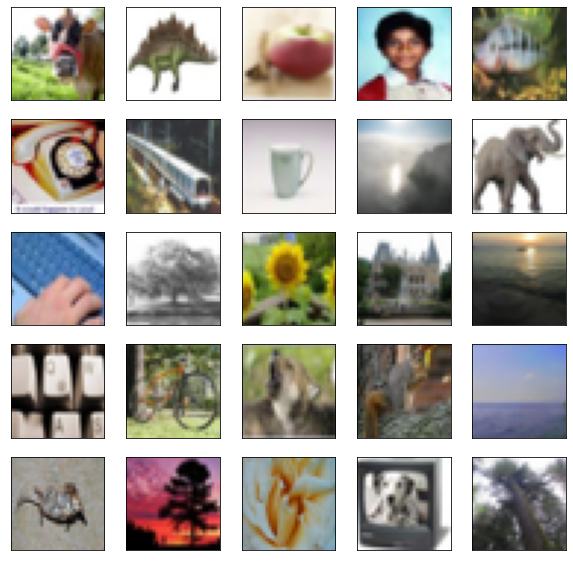

In [2]:
num_classes = 100
input_shape = (32, 32, 3)
(x_train, y_train), (x_test, y_test) = keras.datasets.cifar100.load_data()
x_train, x_test = x_train / 255.0, x_test / 255.0
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)
print(f"x_train shape: {x_train.shape} - y_train shape: {y_train.shape}")
print(f"x_test shape: {x_test.shape} - y_test shape: {y_test.shape}")

plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i + 1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(x_train[i])
plt.show()

In [3]:
patch_size = (2, 2)
dropout_rate = 0.03
num_heads = 8
embed_dim = 64
num_mlp = 256
qkv_bias = True
window_size = 2
shift_size = 1
image_dimension = 32
num_patch_x = input_shape[0] // patch_size[0]
num_patch_y = input_shape[1] // patch_size[1]
learning_rate = 1e-3
batch_size = 128
num_epochs = 40
validation_split = 0.1
weight_decay = 0.0001
label_smoothing = 0.1

In [20]:
def window_partition(x, window_size):
    _, height, width, channels = x.shape
    patch_num_y = height // window_size
    patch_num_x = width // window_size
    x = tf.reshape(x, shape=(-1, patch_num_y, window_size, patch_num_x, window_size, channels))
    x = tf.transpose(x, (0, 1, 3, 2, 4, 5))
    windows = tf.reshape(x, shape=(-1, window_size, window_size, channels))
    return windows

def window_reverse(windows, window_size, height, width, channels):
    patch_num_y = height // window_size
    patch_num_x = width // window_size
    x = tf.reshape(windows, shape=(-1, patch_num_y, patch_num_x, window_size, window_size, channels))
    x = tf.transpose(x, perm=(0, 1, 3, 2, 4, 5))
    x = tf.reshape(x, shape=(-1, height, width, channels))
    return x

class DropPath(layers.Layer):
    def __init__(self, drop_prob=None, **kwargs):
        super(DropPath, self).__init__(**kwargs)
        self.drop_prob = drop_prob
    def call(self, x):
        input_shape = tf.shape(x)
        batch_size = input_shape[0]
        rank = x.shape.rank
        shape = (batch_size, ) + (1, ) * (rank - 1)
        random_tensor = (1 - self.drop_prob) + tf.random.uniform(shape, dtype=x.dtype)
        path_mask = tf.floor(random_tensor)
        output = tf.math.divide(x, 1 - self.drop_prob) * path_mask
        return output

In [25]:
class WindowAttention(layers.Layer):
    def __init__(self, dim, window_size, num_heads, qkv_bias=True, dropout_rate=0.0, **kwargs):
        super(WindowAttention, self).__init__(**kwargs)
        self.dim = dim
        self.window_size = window_size
        self.num_heads = num_heads
        self.scale = (dim // num_heads) ** -0.5
        self.qkv = layers.Dense(dim * 3, use_bias=qkv_bias)
        self.dropout = layers.Dropout(dropout_rate)
        self.proj = layers.Dense(dim)
    def build(self, input_shape):
        num_window_elements = (2 * self.window_size[0] - 1) * (2 * self.window_size[1] - 1)
        self.relative_position_bias_table = self.add_weight(shape=(num_window_elements, self.num_heads), initializer=
                                                           tf.initializers.Zeros(), trainable=True)
        coords_h = np.arange(self.window_size[0])
        coords_w = np.arange(self.window_size[1])
        coords_matrix = np.meshgrid(coords_h, coords_w, indexing="ij")
        coords = np.stack(coords_matrix)
        coords_flatten = coords.reshape(2, -1)
        relative_coords =coords_flatten[:, :, None] - coords_flatten[:, None, :]
        relative_coords = relative_coords.transpose([1, 2, 0])
        relative_coords[:, :, 0] += self.window_size[0] - 1
        relative_coords[:, :, 1] += self.window_size[1] - 1
        relative_coords[:, :, 0] *= 2 * self.window_size[1] - 1
        relative_position_index = relative_coords.sum(-1)
        
        self.relative_position_index = tf.Variable(initial_value = tf.convert_to_tensor(relative_position_index), 
                                                   trainable=False)
    def call(self, x, mask=None):
        _, size, channels = x.shape
        head_dim = channels // self.num_heads
        x_qkv = self.qkv(x)
        x_qkv = tf.reshape(x_qkv, shape=(-1, size, 3, self.num_heads, head_dim))
        x_qkv = tf.transpose(x_qkv, perm=(2, 0, 3, 1, 4))
        q, k, v = x_qkv[0], x_qkv[1], x_qkv[2]
        q = q * self.scale
        k = tf.transpose(k, perm=(0, 1, 3, 2))
        attn = q @ k
        
        num_window_elements = self.window_size[0] * self.window_size[1]
        relative_position_index_flat = tf.reshape(self.relative_position_index, shape=(-1, ))
        relative_position_bias = tf.gather(self.relative_position_bias_table, relative_position_index_flat)
        relative_position_bias = tf.reshape(relative_position_bias, shape=(num_window_elements, num_window_elements,
                                                                           -1))
        relative_position_bias = tf.transpose(relative_position_bias, perm=(2, 0, 1))
        attn = attn + tf.expand_dims(relative_position_bias, axis=0)
        if mask is not None:
            nW = mask.get_shape()[0]
            mask_float = tf.cast(tf.expand_dims(tf.expand_dims(mask, axis=1), axis=0), tf.float32)
            attn = (tf.reshape(attn, shape=(-1, nW, self.num_heads, size, size)) + mask_float)
            attn = tf.reshape(attn, shape=(-1, self.num_heads, size, size))
            attn = keras.activations.softmax(attn, axis=-1)
        else:
            attn = keras.activations.softmax(attn, axis=-1)
        attn = self.dropout(attn)
        x_qkv = attn @ v
        x_qkv = tf.transpose(x_qkv, perm=(0, 2, 1, 3))
        x_qkv = tf.reshape(x_qkv, shape=(-1, size, channels))
        x_qkv = self.proj(x_qkv)
        x_qkv = self.dropout(x_qkv)
        return x_qkv

In [26]:
class SwinTransformer(layers.Layer):
    def __init__(self, dim, num_patch, num_heads, window_size=7, shift_size=0, num_mlp=1024, qkv_bias=True, 
                 dropout_rate=0.0, **kwargs):
        super(SwinTransformer, self).__init__(**kwargs)
        self.dim = dim
        self.num_patch = num_patch
        self.num_heads = num_heads
        self.window_size = window_size
        self.shift_size = shift_size
        self.num_mlp = num_mlp
        self.norm1 = layers.LayerNormalization(epsilon=1e-5)
        self.attn = WindowAttention(dim, window_size=(self.window_size, self.window_size), num_heads=num_heads, 
                                   qkv_bias=qkv_bias, dropout_rate=dropout_rate)
        self.drop_path = DropPath(dropout_rate)
        self.norm2 = layers.LayerNormalization(epsilon=1e-5)
        self.mlp = keras.Sequential([
            layers.Dense(num_mlp),
            layers.Activation(keras.activations.gelu),
            layers.Dropout(dropout_rate),
            layers.Dense(dim),
            layers.Dropout(dropout_rate)
        ])
        if min(self.num_patch) < self.window_size:
            self.shift_size = 0
            self.window_size = min(self.num_patch)
    def build(self, input_shape):
        if self.shift_size == 0:
            self.attn_mask = None
        else:
            height, width = self.num_patch
            h_slices = (slice(0, -self.window_size), slice(-self.window_size, -self.shift_size), 
                        slice(-self.shift_size, None))
            w_slices = (slice(0, -self.window_size), slice(-self.window_size, -self.shift_size), 
                       slice(-self.shift_size, None))
            mask_array = np.zeros((1, height, width, 1))
            count = 0
            for h in h_slices:
                for w in w_slices:
                    mask_array[:, h, w, :] = count
                    count += 1
            mask_array = tf.convert_to_tensor(mask_array)
            mask_windows = window_partition(mask_array, self.window_size)
            mask_windows = tf.reshape(mask_windows, shape=[-1, self.window_size * self.window_size])
            attn_mask = tf.expand_dims(mask_windows, axis=1) - tf.expand_dims(mask_windows, axis=2)
            attn_mask = tf.where(attn_mask != 0, -100.0, attn_mask)
            attn_mask = tf.where(attn_mask == 0, 0.0, attn_mask)
            self.attn_mask = tf.Variable(initial_value=attn_mask, trainable=False)
            
    def call(self, x):
        height, width = self.num_patch
        _, num_patches_before, channels = x.shape
        x_skip = x
        x = self.norm1(x)
        x = tf.reshape(x, shape=(-1, height, width, channels))
        if self.shift_size > 0:
            shifted_x = tf.roll(x, shift=[-self.shift_size, -self.shift_size], axis=[1, 2])
        else:
            shifted_x = x
        x_windows = window_partition(shifted_x, self.window_size)
        x_windows = tf.reshape(x_windows, shape=(-1, self.window_size * self.window_size, channels))
        attn_windows = self.attn(x_windows, mask=self.attn_mask)
        attn_windows = tf.reshape(x_windows, shape=(-1, self.window_size, self.window_size, channels))
        shifted_x = window_reverse(attn_windows, self.window_size, height, width, channels)
        if self.shift_size > 0:
            x = tf.roll(shifted_x, shift=[self.shift_size, self.shift_size], axis=[1, 2])
        else:
            x = shifted_x
        x = tf.reshape(x, shape=(-1, height * width, channels))
        x = self.drop_path(x)
        x = x_skip + x
        x_skip = x
        x = self.norm2(x)
        x = self.mlp(x)
        x = self.drop_path(x)
        x = x_skip + x
        return x

In [27]:
class PatchExtract(layers.Layer):
    def __init__(self, patch_size, **kwargs):
        super(PatchExtract, self).__init__(**kwargs)
        self.patch_size_x = patch_size[0]
        self.patch_size_y = patch_size[0]
    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(images=images, sizes=(1, self.patch_size_x, self.patch_size_y, 1),
                                          strides=(1, self.patch_size_x, self.patch_size_y, 1),
                                          rates=(1, 1, 1, 1),
                                          padding="VALID")
        patch_dim = patches.shape[-1]
        patch_num = patches.shape[1]
        return tf.reshape(patches, (batch_size, patch_num * patch_num, patch_dim))

class PatchEmbedding(layers.Layer):
    def __init__(self, num_patch, embed_dim, **kwargs):
        super(PatchEmbedding, self).__init__(**kwargs)
        self.num_patch = num_patch
        self.proj = layers.Dense(embed_dim)
        self.pos_embed = layers.Embedding(input_dim=num_patch, output_dim=embed_dim)
    def call(self, patch):
        pos = tf.range(start=0, limit=self.num_patch, delta=1)
        return self.proj(patch) + self.pos_embed(pos)

class PatchMerging(tf.keras.layers.Layer):
    def __init__(self, num_patch, embed_dim):
        super(PatchMerging, self).__init__()
        self.num_patch = num_patch
        self.embed_dim = embed_dim
        self.linear_trans = layers.Dense(2 * embed_dim, use_bias=False)
    def call(self, x):
        height, width = self.num_patch
        _, _, C = x.get_shape().as_list()
        x = tf.reshape(x, shape=(-1, height, width, C))
        x0 = x[:, 0::2, 0::2, :]
        x1 = x[:, 1::2, 0::2, :]
        x2 = x[:, 0::2, 1::2, :]
        x3 = x[:, 1::2, 1::2, :]
        x = tf.concat((x0, x1, x2, x3), axis=-1)
        x = tf.reshape(x, shape=(-1, (height // 2) * (width // 2), 4 * C))
        return self.linear_trans(x)

In [28]:
input = layers.Input(input_shape)
x = layers.RandomCrop(image_dimension, image_dimension)(input)
x = layers.RandomFlip("horizontal")(x)
x = PatchExtract(patch_size)(x)
x = PatchEmbedding(num_patch_x * num_patch_y, embed_dim)(x)
x = SwinTransformer(dim=embed_dim, num_patch=(num_patch_x, num_patch_y), num_heads=num_heads, window_size=window_size,
                   shift_size=0, num_mlp=num_mlp, qkv_bias=qkv_bias, dropout_rate=dropout_rate)(x)
x = SwinTransformer(dim=embed_dim, num_patch=(num_patch_x, num_patch_y), num_heads=num_heads, window_size=window_size,
                   shift_size=shift_size, num_mlp=num_mlp, qkv_bias=qkv_bias, dropout_rate=dropout_rate)(x)
x = PatchMerging((num_patch_x, num_patch_y), embed_dim=embed_dim)(x)
x = layers.GlobalAveragePooling1D()(x)
output = layers.Dense(num_classes, activation="softmax")(x)

In [29]:
model=keras.Model(input, output)
model.compile(loss=keras.losses.CategoricalCrossentropy(label_smoothing=label_smoothing),
             optimizer=tfa.optimizers.AdamW(learning_rate=learning_rate, weight_decay=weight_decay),
             metrics=[
                 keras.metrics.CategoricalAccuracy(name="accuracy"),
                 keras.metrics.TopKCategoricalAccuracy(5, name="top-5-accuracy")
             ])
history = model.fit(x_train, y_train, batch_size=batch_size, epochs=num_epochs, validation_split=validation_split)

Epoch 1/40
352/352 [==============================] - 490s 1s/step - loss: 4.3843 - accuracy: 0.0548 - top-5-accuracy: 0.1875 - val_loss: 4.1391 - val_accuracy: 0.0916 - val_top-5-accuracy: 0.2774
Epoch 2/40
352/352 [==============================] - 481s 1s/step - loss: 3.9541 - accuracy: 0.1226 - top-5-accuracy: 0.3432 - val_loss: 3.8459 - val_accuracy: 0.1554 - val_top-5-accuracy: 0.3958
Epoch 3/40
352/352 [==============================] - 481s 1s/step - loss: 3.7189 - accuracy: 0.1736 - top-5-accuracy: 0.4310 - val_loss: 3.6799 - val_accuracy: 0.1920 - val_top-5-accuracy: 0.4454
Epoch 4/40
352/352 [==============================] - 481s 1s/step - loss: 3.5834 - accuracy: 0.2040 - top-5-accuracy: 0.4828 - val_loss: 3.5605 - val_accuracy: 0.2136 - val_top-5-accuracy: 0.4928
Epoch 5/40
352/352 [==============================] - 480s 1s/step - loss: 3.4870 - accuracy: 0.2290 - top-5-accuracy: 0.5118 - val_loss: 3.5010 - val_accuracy: 0.2330 - val_top-5-accuracy: 0.5136
Epoch 6/40
352/

352/352 [==============================] - 366s 1s/step - loss: 2.8173 - accuracy: 0.4012 - top-5-accuracy: 0.7100 - val_loss: 2.9527 - val_accuracy: 0.3678 - val_top-5-accuracy: 0.6706
Epoch 36/40
352/352 [==============================] - 366s 1s/step - loss: 2.8198 - accuracy: 0.3978 - top-5-accuracy: 0.7089 - val_loss: 2.9546 - val_accuracy: 0.3744 - val_top-5-accuracy: 0.6800
Epoch 37/40
352/352 [==============================] - 366s 1s/step - loss: 2.8033 - accuracy: 0.4048 - top-5-accuracy: 0.7146 - val_loss: 2.9666 - val_accuracy: 0.3678 - val_top-5-accuracy: 0.6734
Epoch 38/40
352/352 [==============================] - 367s 1s/step - loss: 2.8043 - accuracy: 0.4049 - top-5-accuracy: 0.7141 - val_loss: 2.9453 - val_accuracy: 0.3746 - val_top-5-accuracy: 0.6734
Epoch 39/40
352/352 [==============================] - 366s 1s/step - loss: 2.8048 - accuracy: 0.4063 - top-5-accuracy: 0.7122 - val_loss: 2.9505 - val_accuracy: 0.3662 - val_top-5-accuracy: 0.6778
Epoch 40/40
352/352 [=

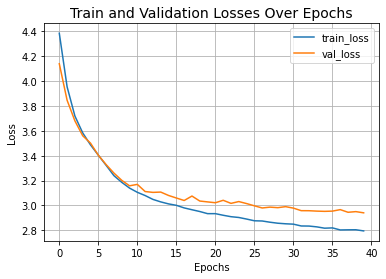

In [30]:
plt.plot(history.history["loss"], label="train_loss")
plt.plot(history.history["val_loss"], label="val_loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Train and Validation Losses Over Epochs", fontsize=14)
plt.legend()
plt.grid()
plt.show()

In [31]:
loss, accuracy, top_5_accuracy = model.evaluate(x_test, y_test)
print(f"Test loss: {round(loss, 2)}")
print(f"Test accuracy: {round(accuracy * 100, 2)}%")
print(f"Test top 5 accuracy: {round(top_5_accuracy * 100, 2)}%")

313/313 [==============================] - 23s 73ms/step - loss: 2.8976 - accuracy: 0.3741 - top-5-accuracy: 0.6875
Test loss: 2.9
Test accuracy: 37.41%
Test top 5 accuracy: 68.75%


# Project 37

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa
from datetime import datetime
import matplotlib.pyplot as plt
import numpy as np
import math

C:\Users\jatin\anaconda3\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.5.0 and strictly below 2.8.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.8.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  warnings.warn(


In [2]:
BATCH_SIZE = 256
AUTO = tf.data.AUTOTUNE
INPUT_SHAPE = (32, 32, 3)
NUM_CLASSES = 10

LEARNING_RATE = 1e-3
WEIGHT_DECAY = 1e-4

EPOCHS = 20

IMAGE_SIZE = 48
PATCH_SIZE = 6
NUM_PATCHES = (IMAGE_SIZE // PATCH_SIZE) ** 2

LAYER_NORM_EPS = 1e-6
PROJECTION_DIM = 128
NUM_HEADS = 4
NUM_LAYERS = 4
MLP_UNITS = [
    PROJECTION_DIM * 2,
    PROJECTION_DIM,
]
NUM_TOKENS = 4

In [4]:
(x_train, y_train), (x_test, y_test) = keras.datasets.cifar10.load_data()
(x_train, y_train), (x_val, y_val) = ((x_train[:40000], y_train[:40000]), (x_train[40000:], y_train[40000:]))
print(f"Training samples: {len(x_train)}")
print(f"Validation samples: {len(x_val)}")
print(f"Testing samples: {len(x_test)}")

train_ds = tf.data.Dataset.from_tensor_slices((x_train, y_train))
train_ds = train_ds.shuffle(BATCH_SIZE * 100).batch(BATCH_SIZE).prefetch(AUTO)

val_ds = tf.data.Dataset.from_tensor_slices((x_val, y_val))
val_ds = val_ds.batch(BATCH_SIZE).prefetch(AUTO)

test_ds = tf.data.Dataset.from_tensor_slices((x_test, y_test))
test_ds = test_ds.batch(BATCH_SIZE).prefetch(AUTO)

Training samples: 40000
Validation samples: 10000
Testing samples: 10000


In [5]:
data_augmentation = keras.Sequential([
    layers.Rescaling(1 / 255.0),
    layers.Resizing(INPUT_SHAPE[0] + 20, INPUT_SHAPE[0] + 20),
    layers.RandomCrop(IMAGE_SIZE, IMAGE_SIZE),
    layers.RandomFlip("horizontal"),
], name="data_augmentation")

In [6]:
def position_embedding(projected_patches, num_patches=NUM_PATCHES, projection_dim=PROJECTION_DIM):
    positions = tf.range(start=0, limit=num_patches, delta=1)
    encoded_positions = layers.Embedding(input_dim=num_patches, output_dim=projection_dim)(positions)
    return projected_patches + encoded_positions

In [7]:
def mlp(x, dropout_rate, hidden_units):
    for units in hidden_units:
        x = layers.Dense(units, activation=tf.nn.gelu)(x)
        x = layers.Dropout(dropout_rate)(x)
    return x

In [8]:
def token_learner(inputs, number_of_tokens=NUM_TOKENS):
    x = layers.LayerNormalization(epsilon=LAYER_NORM_EPS)(inputs)
    attention_maps = keras.Sequential([
        layers.Conv2D(filters=number_of_tokens, kernel_size=(3, 3), activation=tf.nn.gelu,padding="same", 
                      use_bias=False),
        layers.Conv2D(filters=number_of_tokens, kernel_size=(3, 3), activation=tf.nn.gelu, padding="same", 
                     use_bias=False),
        layers.Conv2D(filters=number_of_tokens, kernel_size=(3, 3), activation=tf.nn.gelu, padding="same",
                     use_bias=False),
        layers.Conv2D(filters=number_of_tokens, kernel_size=(3, 3), activation="sigmoid", padding="same",
                     use_bias=False),
        layers.Reshape((-1, number_of_tokens)),
        layers.Permute((2, 1))
    ])(x)
    num_filters=inputs.shape[-1]
    inputs = layers.Reshape((1, -1, num_filters))(inputs)
    
    attended_inputs = (attention_maps[..., tf.newaxis] * inputs)
    outputs = tf.reduce_mean(attended_inputs, axis=2)
    return outputs

In [9]:
def transformer(encoded_patches):
    x1 = layers.LayerNormalization(epsilon=LAYER_NORM_EPS)(encoded_patches)
    
    attention_output = layers.MultiHeadAttention(num_heads=NUM_HEADS, key_dim=PROJECTION_DIM, dropout=0.1)(x1, x1)
    x2 = layers.Add()([attention_output, encoded_patches])
    x3 = layers.LayerNormalization(epsilon=LAYER_NORM_EPS)(x2)
    x4 = mlp(x3, hidden_units=MLP_UNITS, dropout_rate=0.1)
    encoded_patches = layers.Add()([x4, x2])
    return encoded_patches

In [10]:
def create_vit_classifier(use_token_learner=True, token_learner_units=NUM_TOKENS):
    inputs = layers.Input(shape=INPUT_SHAPE)
    augmented = data_augmentation(inputs)
    projected_patches = layers.Conv2D(filters=PROJECTION_DIM, kernel_size=(PATCH_SIZE, PATCH_SIZE), 
                                     strides=(PATCH_SIZE, PATCH_SIZE), padding="VALID")(augmented)
    _, h, w, c = projected_patches.shape
    projected_patches = layers.Reshape((h * w, c))(projected_patches)
    encoded_patches = position_embedding(projected_patches)
    encoded_patches = layers.Dropout(0.1)(encoded_patches)
    
    for i in range(NUM_LAYERS):
        encoded_patches = transformer(encoded_patches)
        if use_token_learner and i == NUM_LAYERS // 2:
            _ , hh, c = encoded_patches.shape
            h = int(math.sqrt(hh))
            encoded_patches = layers.Reshape((h, h, c))(encoded_patches)
            encoded_patches = token_learner(encoded_patches, token_learner_units)
    representation = layers.LayerNormalization(epsilon=LAYER_NORM_EPS)(encoded_patches)
    representation = layers.GlobalAvgPool1D()(representation)
    
    outputs = layers.Dense(NUM_CLASSES, activation="softmax")(representation)
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

In [11]:
def run_experiment(model):
    optimizer = tfa.optimizers.AdamW(learning_rate=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
    model.compile(optimizer=optimizer, loss="sparse_categorical_crossentropy", 
                  metrics=[keras.metrics.SparseCategoricalAccuracy(name="accuracy"), 
                          keras.metrics.SparseTopKCategoricalAccuracy(5, name="top-5-accuracy")])
    _ = model.fit(train_ds, epochs=EPOCHS, validation_data=val_ds)
    _, accuracy, top_5_accuracy = model.evaluate(test_ds)
    print(f"Test accuracy: {round(accuracy * 100, 2)}%")
    print(f"Test top 5 accuracy: {round(top_5_accuracy * 100, 2)}%")

In [12]:
vit_token_learner = create_vit_classifier()
run_experiment(vit_token_learner)

Epoch 1/20
157/157 [==============================] - 806s 5s/step - loss: 2.2570 - accuracy: 0.1448 - top-5-accuracy: 0.6079 - val_loss: 2.0317 - val_accuracy: 0.2226 - val_top-5-accuracy: 0.7906
Epoch 2/20
157/157 [==============================] - 791s 5s/step - loss: 1.9145 - accuracy: 0.2728 - top-5-accuracy: 0.8156 - val_loss: 1.7700 - val_accuracy: 0.3433 - val_top-5-accuracy: 0.8579
Epoch 3/20
157/157 [==============================] - 794s 5s/step - loss: 1.7444 - accuracy: 0.3433 - top-5-accuracy: 0.8645 - val_loss: 1.6907 - val_accuracy: 0.3749 - val_top-5-accuracy: 0.8747
Epoch 4/20
157/157 [==============================] - 792s 5s/step - loss: 1.6370 - accuracy: 0.3934 - top-5-accuracy: 0.8892 - val_loss: 1.5898 - val_accuracy: 0.4131 - val_top-5-accuracy: 0.8992
Epoch 5/20
157/157 [==============================] - 794s 5s/step - loss: 1.5555 - accuracy: 0.4212 - top-5-accuracy: 0.9086 - val_loss: 1.5335 - val_accuracy: 0.4325 - val_top-5-accuracy: 0.9069
Epoch 6/20
157/

# Projects 38

In [1]:
import numpy as np
import tensorflow as tf
from tensorflow import keras

img_width = 180
img_height = 180

layer_name = "conv3_block4_out"

In [3]:
model = keras.applications.ResNet50V2(weights="imagenet", include_top=False)
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.inputs, outputs=layer.output)

94683136/94668760 [==============================] - 203s 2us/step


In [4]:
def compute_loss(input_image, filter_index):
    activation = feature_extractor(input_image)
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    return tf.reduce_mean(filter_activation)

In [5]:
@tf.function
def gradient_ascent_step(img, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(img)
        loss = compute_loss(img, filter_index)
    grads = tape.gradient(loss, img)
    grads = tf.math.l2_normalize(grads)
    img += learning_rate * grads
    return loss, img

In [6]:
def initialize_image():
    img = tf.random.uniform((1, img_width, img_height, 3))
    return (img - 0.5) * 0.25

def visualize_filter(filter_index):
    iterations = 30
    learning_rate = 10.0
    img = initialize_image()
    for iteration in range(iterations):
        loss, img = gradient_ascent_step(img, filter_index, learning_rate)
    img = deprocess_image(img[0].numpy())
    return loss, img

def deprocess_image(img):
    img -= img.mean()
    img /= img.std() + 1e-5
    img *= 0.15
    img = img[25:-25, 25:-25, :]
    img += 0.5
    img = np.clip(img, 0, 1)
    img *= 255
    img = np.clip(img, 0, 255).astype("uint8")
    return img

In [7]:
from IPython.display import Image, display
loss, img = visualize_filter(0)
keras.preprocessing.image.save_img("0.png", img)

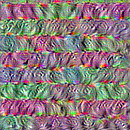

In [8]:
display(Image("0.png"))

# Project 38

In [9]:
import math
import numpy as np
import tensorflow as tf
from tensorflow import keras
import tensorflow_addons as tfa
import matplotlib.pyplot as plt
from tensorflow.keras import layers

SEED = 42
keras.utils.set_random_seed(SEED)

C:\Users\jatin\anaconda3\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.5.0 and strictly below 2.8.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.8.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  warnings.warn(


In [10]:
NUM_CLASSES = 100
INPUT_SHAPE = (32, 32, 3)
(x_train, y_train), (x_test, y_test) = keras.datasets.cifar100.load_data()
print(f"x_train shape: {x_train.shape} - y_train shape: {y_train.shape}")
print(f"x_test shape: {x_test.shape} - y_test shape: {y_test.shape}")

x_train shape: (50000, 32, 32, 3) - y_train shape: (50000, 1)
x_test shape: (10000, 32, 32, 3) - y_test shape: (10000, 1)


In [11]:
BUFFER_SIZE = 512
BATCH_SIZE = 256

IMAGE_SIZE = 72
PATCH_SIZE = 6
NUM_PATCHES = (IMAGE_SIZE // PATCH_SIZE)

LEARNING_RATE = 0.001
WEIGHT_DECAY = 0.0001

EPOCHS = 50

LAYER_NORM_EPS = 1e-6
TRANSFORMER_LAYERS = 8
PROJECTION_DIM = 64
NUM_HEADS = 4
TRANSFORMER_UNITS = [
    PROJECTION_DIM * 2, PROJECTION_DIM
]
MLP_HEAD_UNITS = [2048, 1024]

In [12]:
data_augmentation = keras.Sequential([
    layers.Normalization(),
    layers.Resizing(IMAGE_SIZE, IMAGE_SIZE),
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(factor=0.02),
    layers.RandomZoom(height_factor=0.2, width_factor=0.2)
], name="data_augmentation")
data_augmentation.layers[0].adapt(x_train)

In [18]:
class ShiftedPatchTokenization(layers.Layer):
    def __init__(self, image_size=IMAGE_SIZE, patch_size=PATCH_SIZE, num_patches=NUM_PATCHES, 
                 projection_dim=PROJECTION_DIM, vanilla=False, **kwargs):
        super().__init__(**kwargs)
        self.vanilla = vanilla
        self.image_size = image_size
        self.patch_size = patch_size
        self.half_patch = patch_size // 2
        self.flatten_patches = layers.Reshape((num_patches, -1))
        self.projection = layers.Dense(units=projection_dim)
        self.layer_norm = layers.LayerNormalization(epsilon=LAYER_NORM_EPS)
    
    def crop_shift_pad(self, images, mode):
        if mode == "left-up":
            crop_height = self.half_patch
            crop_width = self.half_patch
            shift_height = 0
            shift_width = 0
        elif mode == "left-down":
            crop_height = 0
            crop_width = self.half_patch
            shift_height = self.half_patch
            shift_width = 0
        elif mode == "right-up":
            crop_height = self.half_patch
            crop_width = 0
            shift_height = 0
            shift_width = self.half_patch
        else:
            crop_height = 0
            crop_width = 0
            shift_height = self.half_patch
            shift_width = self.half_patch
        crop = tf.image.crop_to_bounding_box(images, offset_height=crop_height, offset_width=crop_width, 
                                             target_height=self.image_size-self.half_patch, 
                                            target_width=self.image_size - self.half_patch)
        shift_pad = tf.image.pad_to_bounding_box(crop, offset_height=shift_height, offset_width=shift_width, 
                                                 target_height=self.image_size, target_width=self.image_size)
        return shift_pad
    
    def call(self, images):
        if not self.vanilla:
            images = tf.concat([
                images, 
                self.crop_shift_pad(images, mode="left-up"),
                self.crop_shift_pad(images, mode="left-down"),
                self.crop_shift_pad(images, mode="right-up"),
                self.crop_shift_pad(images, mode="right-down"),
            ], axis=-1)
        patches = tf.image.extract_patches(images=images, sizes=[1, self.patch_size, self.patch_size, 1], 
                                          strides = [1, self.patch_size, self.patch_size, 1], rates=[1, 1, 1, 1], 
                                          padding="VALID")
        flat_patches = self.flatten_patches(patches)
        if not self.vanilla:
            tokens = self.layer_norm(flat_patches)
            tokens = self.projection(tokens)
        else:
            tokens = self.projection(flat_patches)
        return (tokens, patches)

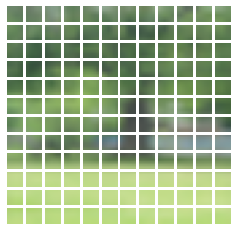

ORIGINAL


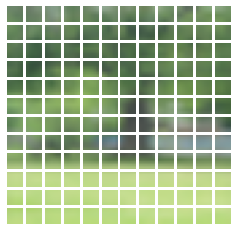

LEFT-UP


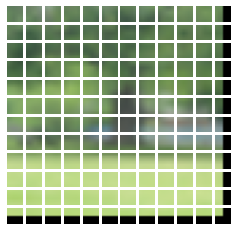

LEFT-DOWN


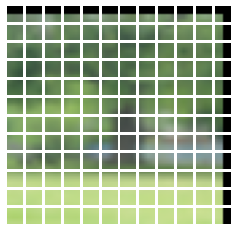

RIGHT-UP


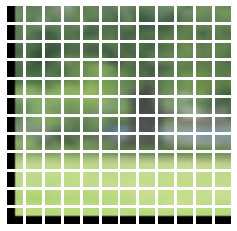

RIGHT-DOWN


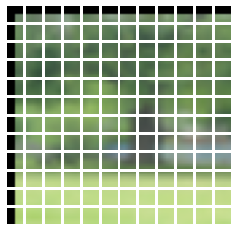

In [19]:
image = x_train[np.random.choice(range(x_train.shape[0]))]
resized_image = tf.image.resize(tf.convert_to_tensor([image]), size=(IMAGE_SIZE, IMAGE_SIZE))
(token, patch) = ShiftedPatchTokenization(vanilla=True)(resized_image / 255.0)
(token, patch) = (token[0], patch[0])
count = 1
n = patch.shape[0]
plt.figure(figsize=(4, 4))
for row in range(n):
    for col in range(n):
        plt.subplot(n, n, count)
        count = count + 1
        image = tf.reshape(patch[row][col], (PATCH_SIZE, PATCH_SIZE, 3))
        plt.imshow(image)
        plt.axis("off")
plt.show()

(token, patch) = ShiftedPatchTokenization(vanilla=False)(resized_image / 255.0)
(token, patch) = (token[0], patch[0])
n = patch.shape[0]
shifted_images = ["ORIGINAL", "LEFT-UP", "LEFT-DOWN", "RIGHT-UP", "RIGHT-DOWN"]
for index, name in enumerate(shifted_images):
    print(name)
    count = 1
    plt.figure(figsize=(4, 4))
    for row in range(n):
        for col in range(n):
            plt.subplot(n, n, count)
            count = count + 1
            image = tf.reshape(patch[row][col], (PATCH_SIZE, PATCH_SIZE, 5 * 3))
            plt.imshow(image[..., 3 * index: 3 * index + 3])
            plt.axis("off")
    plt.show()

In [20]:
class PatchEncoder(layers.Layer):
    def __init__(self, num_patches=NUM_PATCHES, projection_dim=PROJECTION_DIM, **kwargs):
        super().__init__(**kwargs)
        self.num_patches = num_patches
        self.position_embedding = layers.Embedding(input_dim = num_patches, output_dim=projection_dim)
        self.positions = tf.range(start=0, limit=self.num_patches, delta=1)
    def call(self, encoded_patches):
        encoded_positions = self.position_embedding(self.positions)
        encoded_patches = encoded_patches + encoded_positions
        return encoded_patches

In [38]:
class MultiHeadAttentionLSA(tf.keras.layers.MultiHeadAttention):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.tau = tf.Variable(math.sqrt(float(self._key_dim)), trainable=True)
    
    def _compute_attention(self, query, key, value, attention_mask=None, training=None):
        query = tf.multiply(query, 1.0 / self.tau)
        attention_scores = tf.einsum(self._dot_product_equation, key, query)
        attention_scores = self._masked_softmax(attention_scores, attention_mask)
        attention_scores_dropout = self._dropout_layer(attention_scores, training=training)
        attention_output = tf.einsum(self._combine_equation, attention_scores_dropout, value)
        return attention_output, attention_scores

In [39]:
def mlp(x, hidden_units, dropout_rate):
    for units in hidden_units:
        x = layers.Dense(units, activation=tf.nn.gelu)(x)
        x = layers.Dropout(dropout_rate)(x)
    return x

diag_attn_mask = 1 - tf.eye(NUM_PATCHES)
diag_attn_mask = tf.cast([diag_attn_mask], dtype=tf.int8)

In [40]:
def create_vit_classifier(vanilla=False):
    inputs = layers.Input(shape=INPUT_SHAPE)
    augmented = data_augmentation(inputs)
    (tokens, _) = ShiftedPatchTokenization(vanilla=vanilla)(augmented)
    encoded_patches = PatchEncoder()(tokens)
    
    for _ in range(TRANSFORMER_LAYERS):
        x1 = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
        if not vanilla:
            attention_output = MultiHeadAttentionLSA(num_heads=NUM_HEADS, key_dim=PROJECTION_DIM, dropout=0.1)(x1, 
                                                            x1, attention_mask=diag_attn_mask)
        else:
            attention_output = layers.MultiHeadAttention(num_heads=NUM_HEADS, key_dim=PROJECTION_DIM, dropout=0.1)(x1,
                                                                                                                  x1)
        x2 = layers.Add()([attention_output, encoded_patches])
        x3 = layers.LayerNormalization(epsilon=1e-6)(x2)
        x3 = mlp(x3, hidden_units=TRANSFORMER_UNITS, dropout_rate=0.1)
        encoded_patches = layers.Add()([x3, x2])
    representation = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
    representation = layers.Flatten()(representation)
    represenattion = layers.Dropout(0.5)(representation)
    features = mlp(representation, hidden_units=MLP_HEAD_UNITS, dropout_rate=0.5)
    logits = layers.Dense(NUM_CLASSES)(features)
    model = keras.Model(inputs=inputs, outputs=logits)
    return model

In [41]:
class WarmUpCosine(keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, learning_rate_base, total_steps, warmup_learning_rate, warmup_steps):
        super(WarmUpCosine, self).__init__()
        self.learning_rate_base = learning_rate_base
        self.total_steps = total_steps
        self.warmup_learning_rate = warmup_learning_rate
        self.warmup_steps = warmup_steps
        self.pi = tf.constant(np.pi)
    
    def __call__(self, step):
        if self.total_steps < self.warmup_steps:
            raise ValueError("Total_step must be larger or equal to warmup_steps.")
        cos_annealed_lr = tf.cos(self.pi * (tf.cast(step, tf.float32) - self.warmup_steps) / float(self.total_steps
                                                                                     - self.warmup_steps))
        learning_rate = 0.5 * self.learning_rate_base * (1 + cos_annealed_lr)
        if self.warmup_steps > 0:
            if self.learning_rate_base < self.warmup_learning_rate:
                raise ValueError("Learning_rate_base must be larger or equal to warmup_learning_rate")
            slope = (self.learning_rate_base - self.warmup_learning_rate) / self.warmup_steps
            warmup_rate = slope * tf.cast(step, tf.float32) + self.warmup_learning_rate
            learning_rate = tf.where(step < self.warmup_steps, warmup_rate, learning_rate)
        return tf.where(step > self.total_steps, 0.0, learning_rate, name="learning_rate")

In [42]:
def run_experiment(model):
    total_steps = int((len(x_train) / BATCH_SIZE) * EPOCHS)
    warmup_epoch_percentage = 0.10
    warmup_steps = int(total_steps * warmup_epoch_percentage)
    scheduled_lrs = WarmUpCosine(learning_rate_base=LEARNING_RATE, total_steps=total_steps, warmup_learning_rate=0.0,
                                warmup_steps=warmup_steps)
    optimizer = tfa.optimizers.AdamW(learning_rate=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
    model.compile(optimizer=optimizer, loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                 metrics=[
                     keras.metrics.SparseCategoricalAccuracy(name="accuracy"),
                     keras.metrics.SparseTopKCategoricalAccuracy(5, name="top-5-accuracy")
                 ])
    history = model.fit(x = x_train, y=y_train, batch_size=BATCH_SIZE, epochs=EPOCHS, validation_split=0.1)
    _, accuracy, top_5_accuracy = model.evaluate(x_test, y_test, batch_size=BATCH_SIZE)
    print(f"Test accuracy : {round(accuracy * 100, 2)}%")
    print(f"Test top 5 accuracy: {round(top_5_accuracy * 100, 2)}%")
    return history

In [36]:
vit = create_vit_classifier(vanilla=True)
history = run_experiment(vit)

Epoch 1/50
176/176 [==============================] - 149s 803ms/step - loss: 3.9725 - accuracy: 0.1049 - top-5-accuracy: 0.2953 - val_loss: 3.4638 - val_accuracy: 0.1788 - val_top-5-accuracy: 0.4366
Epoch 2/50
176/176 [==============================] - 147s 833ms/step - loss: 3.4743 - accuracy: 0.1768 - top-5-accuracy: 0.4344 - val_loss: 3.2121 - val_accuracy: 0.2230 - val_top-5-accuracy: 0.5058
Epoch 3/50
176/176 [==============================] - 147s 837ms/step - loss: 3.2503 - accuracy: 0.2169 - top-5-accuracy: 0.4921 - val_loss: 3.0469 - val_accuracy: 0.2510 - val_top-5-accuracy: 0.5420
Epoch 4/50
176/176 [==============================] - 147s 836ms/step - loss: 3.0835 - accuracy: 0.2455 - top-5-accuracy: 0.5356 - val_loss: 2.9413 - val_accuracy: 0.2810 - val_top-5-accuracy: 0.5664
Epoch 5/50
176/176 [==============================] - 147s 836ms/step - loss: 2.9536 - accuracy: 0.2663 - top-5-accuracy: 0.5650 - val_loss: 2.8403 - val_accuracy: 0.2982 - val_top-5-accuracy: 0.5908


Epoch 42/50
176/176 [==============================] - 148s 842ms/step - loss: 1.2059 - accuracy: 0.6463 - top-5-accuracy: 0.9153 - val_loss: 2.6034 - val_accuracy: 0.3960 - val_top-5-accuracy: 0.6662
Epoch 43/50
176/176 [==============================] - 148s 839ms/step - loss: 1.1836 - accuracy: 0.6491 - top-5-accuracy: 0.9193 - val_loss: 2.6448 - val_accuracy: 0.3922 - val_top-5-accuracy: 0.6600
Epoch 44/50
176/176 [==============================] - 147s 838ms/step - loss: 1.1854 - accuracy: 0.6525 - top-5-accuracy: 0.9175 - val_loss: 2.6644 - val_accuracy: 0.3960 - val_top-5-accuracy: 0.6654
Epoch 45/50
176/176 [==============================] - 149s 846ms/step - loss: 1.1620 - accuracy: 0.6587 - top-5-accuracy: 0.9216 - val_loss: 2.6407 - val_accuracy: 0.3998 - val_top-5-accuracy: 0.6704
Epoch 46/50
176/176 [==============================] - 149s 848ms/step - loss: 1.1580 - accuracy: 0.6577 - top-5-accuracy: 0.9220 - val_loss: 2.6468 - val_accuracy: 0.3942 - val_top-5-accuracy: 0.

In [43]:
vit_sl = create_vit_classifier(vanilla=False)
history = run_experiment(vit_sl)

Epoch 1/50
176/176 [==============================] - 248s 1s/step - loss: 4.0125 - accuracy: 0.1069 - top-5-accuracy: 0.2902 - val_loss: 3.4723 - val_accuracy: 0.1934 - val_top-5-accuracy: 0.4330
Epoch 2/50
176/176 [==============================] - 243s 1s/step - loss: 3.5438 - accuracy: 0.1712 - top-5-accuracy: 0.4166 - val_loss: 3.2729 - val_accuracy: 0.2182 - val_top-5-accuracy: 0.4900
Epoch 3/50
176/176 [==============================] - 245s 1s/step - loss: 3.3396 - accuracy: 0.2068 - top-5-accuracy: 0.4692 - val_loss: 3.1416 - val_accuracy: 0.2454 - val_top-5-accuracy: 0.5158
Epoch 4/50
176/176 [==============================] - 244s 1s/step - loss: 3.2071 - accuracy: 0.2273 - top-5-accuracy: 0.5024 - val_loss: 3.0612 - val_accuracy: 0.2578 - val_top-5-accuracy: 0.5394
Epoch 5/50
176/176 [==============================] - 244s 1s/step - loss: 3.0871 - accuracy: 0.2484 - top-5-accuracy: 0.5338 - val_loss: 2.9780 - val_accuracy: 0.2794 - val_top-5-accuracy: 0.5550
Epoch 6/50
176/

# Project 39

In [1]:
import os
import io
import imageio
import medmnist
import ipywidgets
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

SEED = 42
os.environ["TF_CUDNN_DETERMINISTIC"] = "1"
keras.utils.set_random_seed(SEED)

In [2]:
DATASET_NAME = "organmnist3d"
BATCH_SIZE = 32
AUTO = tf.data.AUTOTUNE
INPUT_SHAPE = (28, 28, 28, 1)
NUM_CLASSES = 11

LEARNING_RATE = 1e-4
WEIGHT_DECAY = 1e-5

EPOCHS = 60
PATCH_SIZE = (8, 8, 8)
NUM_PATCHES = (INPUT_SHAPE[0] // PATCH_SIZE[0]) ** 2

LAYER_NORM_EPS = 1e-6
PROJECTION_DIM = 128
NUM_HEADS = 8
NUM_LAYERS = 8

In [3]:
def download_and_prepare_dataset(data_info: dict):
    data_path = keras.utils.get_file(origin=data_info["url"], md5_hash=data_info["MD5"])
    
    with np.load(data_path) as data:
        train_videos = data["train_images"]
        valid_videos = data["val_images"]
        test_videos = data["test_images"]
        
        train_labels = data["train_labels"].flatten()
        valid_labels = data["val_labels"].flatten()
        test_labels = data["test_labels"].flatten()
    return ((train_videos, train_labels), (valid_videos, valid_labels), (test_videos, test_labels))
info = medmnist.INFO[DATASET_NAME]

prepared_dataset = download_and_prepare_dataset(info)
(train_videos, train_labels) = prepared_dataset[0]
(valid_videos, valid_labels) = prepared_dataset[1]
(test_videos, test_labels) = prepared_dataset[2]

A local file was found, but it seems to be incomplete or outdated because the md5 file hash does not match the original value of 21f0a239e7f502e6eca33c3fc453c0b6 so we will re-download the data.
32669696/32657407 [==============================] - 506s 15us/step


In [4]:
@tf.function
def preprocess(frames: tf.Tensor, label: tf.Tensor):
    frames = tf.image.convert_image_dtype(frames[..., tf.newaxis], tf.float32)
    label = tf.cast(label, tf.float32)
    return frames, label

def prepare_dataloader(videos: np.ndarray, labels:np.ndarray, loader_type:str="train", batch_size:int=BATCH_SIZE):
    dataset = tf.data.Dataset.from_tensor_slices((videos, labels))
    if loader_type == "train":
        dataset = dataset.shuffle(BATCH_SIZE * 2)
    dataloader = (dataset.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
                 .batch(batch_size)
                 .prefetch(tf.data.AUTOTUNE))
    return dataloader
trainloader = prepare_dataloader(train_videos, train_labels, "train")
validloader = prepare_dataloader(valid_videos, valid_labels, "valid")
testloader = prepare_dataloader(test_videos, test_labels, "test")

In [5]:
class TubeletEmbedding(layers.Layer):
    def __init__(self, embed_dim, patch_size, **kwargs):
        super().__init__(**kwargs)
        self.projection = layers.Conv3D(filters=embed_dim, kernel_size=patch_size, strides=patch_size,
                                        padding="VALID")
        self.flatten = layers.Reshape(target_shape=(-1, embed_dim))
    
    def call(self, videos):
        projected_patches = self.projection(videos)
        flattened_patches = self.flatten(projected_patches)
        return flattened_patches

In [12]:
class PositionalEncoder(layers.Layer):
    def __init__(self, embed_dim, **kwargs):
        super().__init__(**kwargs)
        self.embed_dim = embed_dim
    def build(self, input_shape):
        _, num_tokens, _ = input_shape
        self.position_embedding = layers.Embedding(input_dim=num_tokens, output_dim=self.embed_dim)
        self.positions = tf.range(start=0, limit=num_tokens, delta=1)
    def call(self, encoded_tokens):
        encoded_position = self.position_embedding(self.positions)
        encoded_tokens = encoded_tokens + encoded_position
        return encoded_tokens

In [17]:
def create_vivit_classifier(tubelet_embedder, positional_encoder, input_shape=INPUT_SHAPE, 
                            transformer_layers=NUM_LAYERS, num_heads=NUM_HEADS, layer_norm_eps=LAYER_NORM_EPS, 
                           num_classes=NUM_CLASSES, embed_dim=PROJECTION_DIM):
    inputs = layers.Input(shape=input_shape)
    patches = tubelet_embedder(inputs)
    encoded_patches = positional_encoder(patches)
    for _ in range(transformer_layers):
        x1 = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
        attention_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim // num_heads, 
                                                    dropout=0.1)(x1, x1)
        x2 = layers.Add()([attention_output, encoded_patches])
        x3 = layers.LayerNormalization(epsilon=1e-6)(x2)
        x3 = keras.Sequential([
            layers.Dense(units=embed_dim * 4, activation=tf.nn.gelu),
            layers.Dense(units=embed_dim, activation=tf.nn.gelu),
        ])(x3)
        encoded_patches = layers.Add()([x3, x2])
    representation = layers.LayerNormalization(epsilon=layer_norm_eps)(encoded_patches)
    representation = layers.GlobalAvgPool1D()(representation)
    outputs = layers.Dense(units=num_classes, activation="softmax")(representation)
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

In [18]:
def run_experiment():
    model = create_vivit_classifier(tubelet_embedder=TubeletEmbedding(embed_dim=PROJECTION_DIM, 
                                                                      patch_size=PATCH_SIZE), positional_encoder=
                                   PositionalEncoder(embed_dim=PROJECTION_DIM), )
    optimizer = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
    model.compile(optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics=[
        keras.metrics.SparseCategoricalAccuracy(name="accuracy"),
        keras.metrics.SparseTopKCategoricalAccuracy(5, name="top-5-accuracy")
    ])
    _ = model.fit(trainloader, epochs=EPOCHS, validation_data=validloader)
    _, accuracy, top_5_accuracy = model.evaluate(testloader)
    print(f"Test accuracy: {round(accuracy * 100, 2)}%")
    print(f"Test top 5 accuracy: {round(accuracy * 100, 2)}%")
    return model
model = run_experiment()

Epoch 1/60
31/31 [==============================] - 31s 494ms/step - loss: 2.3784 - accuracy: 0.1379 - top-5-accuracy: 0.5947 - val_loss: 2.2968 - val_accuracy: 0.2484 - val_top-5-accuracy: 0.5714
Epoch 2/60
31/31 [==============================] - 13s 410ms/step - loss: 2.1630 - accuracy: 0.1759 - top-5-accuracy: 0.7027 - val_loss: 1.8928 - val_accuracy: 0.2733 - val_top-5-accuracy: 0.8261
Epoch 3/60
31/31 [==============================] - 13s 411ms/step - loss: 1.9759 - accuracy: 0.2212 - top-5-accuracy: 0.8148 - val_loss: 1.7199 - val_accuracy: 0.3540 - val_top-5-accuracy: 0.8261
Epoch 4/60
31/31 [==============================] - 13s 408ms/step - loss: 1.8395 - accuracy: 0.2788 - top-5-accuracy: 0.8652 - val_loss: 1.5071 - val_accuracy: 0.3913 - val_top-5-accuracy: 0.8944
Epoch 5/60
31/31 [==============================] - 13s 405ms/step - loss: 1.5987 - accuracy: 0.3765 - top-5-accuracy: 0.8981 - val_loss: 1.3323 - val_accuracy: 0.4658 - val_top-5-accuracy: 0.9379
Epoch 6/60
31/3

# Project 40

In [22]:
import os
import random
import numpy as np
from glob import glob
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [26]:
IMAGE_SIZE = 256
BATCH_SIZE = 16
MAX_TRAIN_IMAGES = 400

def load_data(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    image = tf.image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
    image = image / 255.0
    return image

def data_generator(low_light_images):
    dataset = tf.data.Dataset.from_tensor_slices((low_light_images))
    dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    return dataset

train_low_light_images = sorted(glob("D:/datasets_CSV/lol_dataset/our485/low/*"))[:MAX_TRAIN_IMAGES]
val_low_light_images = sorted(glob("D:/datasets_CSV/lol_dataset/our485/low/*"))[MAX_TRAIN_IMAGES:]
test_low_light_images = sorted(glob("D:/datasets_CSV/lol_dataset/eval15/low/*"))

train_dataset = data_generator(train_low_light_images)
val_dataset = data_generator(val_low_light_images)

print("Train Dataset:", train_dataset)
print("Validation Dataset:", val_dataset)

Train Dataset: <BatchDataset element_spec=TensorSpec(shape=(16, 256, 256, 3), dtype=tf.float32, name=None)>
Validation Dataset: <BatchDataset element_spec=TensorSpec(shape=(16, 256, 256, 3), dtype=tf.float32, name=None)>


In [27]:
def build_dce_net():
    input_img = keras.Input(shape=[None, None, 3])
    conv1 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(input_img)
    conv2 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(conv1)
    conv3 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(conv2)
    conv4 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(conv3)
    int_con1 = layers.Concatenate(axis=-1)([conv4, conv3])
    conv5 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(int_con1)
    int_con2 = layers.Concatenate(axis=-1)([conv5, conv2])
    conv6 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(int_con2)
    int_con3 = layers.Concatenate(axis=-1)([conv6, conv1])
    x_r = layers.Conv2D(24, (3, 3), strides=(1, 1), activation="tanh", padding="same")(int_con3)
    return keras.Model(inputs=input_img, outputs=x_r)

In [38]:
def color_contancy_loss(x):
    mean_rgb = tf.reduce_mean(x, axis=(1, 2), keepdims=True)
    mr, mg, mb = mean_rgb[:, :, :, 0], mean_rgb[:, :, :, 1], mean_rgb[:, :, :, 2]
    d_rg = tf.square(mr - mg)
    d_rb = tf.square(mr - mb)
    d_gb = tf.square(mb - mg)
    return tf.sqrt(tf.square(d_rg) + tf.square(d_rb) + tf.square(d_gb))

In [39]:
def exposure_loss(x, mean_val=0.6):
    x = tf.reduce_mean(x, axis=3, keepdims=True)
    mean = tf.nn.avg_pool2d(x, ksize=16, strides=16, padding="VALID")
    return tf.reduce_mean(tf.square(mean - mean_val))

In [40]:
def illumination_smoothness_loss(x):
    batch_size = tf.shape(x)[0]
    h_x = tf.shape(x)[1]
    w_x = tf.shape(x)[2]
    count_h = (tf.shape(x)[2] - 1) * tf.shape(x)[3]
    count_w = tf.shape(x)[2] * (tf.shape(x)[3] - 1)
    h_tv = tf.reduce_sum(tf.square((x[:, 1:, :, :] - x[:, :h_x - 1, :, :])))
    w_tv = tf.reduce_sum(tf.square((x[:, :, 1:, :] - x[:, :, :w_x - 1, :])))
    batch_size = tf.cast(batch_size, dtype=tf.float32)
    count_h = tf.cast(count_h, dtype=tf.float32)
    count_w = tf.cast(count_w, dtype=tf.float32)
    return 2 * (h_tv / count_h + w_tv / count_w) / batch_size

In [44]:
class SpatialConsistencyLoss(keras.losses.Loss):
    def __init__(self, **kwargs):
        super(SpatialConsistencyLoss, self).__init__(reduction="none")
        self.left_kernel = tf.constant([[[[0, 0, 0]], [[-1, 1, 0]], [[0, 0, 0]]]], dtype=tf.float32)
        self.right_kernel = tf.constant([[[[0, 0, 0]], [[0, 1, -1]], [[0, 0, 0]]]], dtype=tf.float32)
        self.up_kernel = tf.constant([[[[0, 0, 0]], [[0, 1, 0]], [[0, 0, 0]]]], dtype=tf.float32)
        self.down_kernel = tf.constant([[[[0, 0, 0]], [[0, 1, 0]], [[0, -1, 0]]]], dtype=tf.float32)
    def call(self, y_true, y_pred):
        original_mean = tf.reduce_mean(y_true, 3, keepdims=True)
        enhanced_mean = tf.reduce_mean(y_pred, 3, keepdims=True)
        original_pool = tf.nn.avg_pool2d(original_mean, ksize=4, strides=4, padding="VALID")
        enhanced_pool = tf.nn.avg_pool2d(enhanced_mean, ksize=4, strides=4, padding="VALID")
        d_original_left = tf.nn.conv2d(original_pool, self.left_kernel, strides=[1, 1, 1, 1], padding="SAME")
        d_original_right = tf.nn.conv2d(original_pool, self.right_kernel, strides=[1, 1, 1, 1], padding="SAME")
        d_original_up = tf.nn.conv2d(original_pool, self.up_kernel, strides=[1, 1, 1, 1], padding="SAME")
        d_original_down = tf.nn.conv2d(original_pool, self.down_kernel, strides=[1, 1, 1, 1], padding="SAME")
        d_enhanced_left = tf.nn.conv2d(enhanced_pool, self.left_kernel, strides=[1, 1, 1, 1], padding="SAME")
        d_enhanced_right = tf.nn.conv2d(enhanced_pool, self.right_kernel, strides=[1, 1, 1, 1], padding="SAME")
        d_enhanced_up = tf.nn.conv2d(enhanced_pool, self.up_kernel, strides=[1, 1, 1, 1], padding="SAME")
        d_enhanced_down = tf.nn.conv2d(enhanced_pool, self.down_kernel, strides=[1, 1, 1, 1], padding="SAME")
        d_left = tf.square(d_original_left - d_enhanced_left)
        d_right = tf.square(d_original_right - d_enhanced_right)
        d_up = tf.square(d_original_up - d_enhanced_up)
        d_down = tf.square(d_original_down - d_enhanced_down)
        return d_left + d_right + d_up + d_down

In [49]:
class ZeroDCE(keras.Model):
    def __init__(self, **kwargs):
        super(ZeroDCE, self).__init__(**kwargs)
        self.dce_model = build_dce_net()
    
    def compile(self, learning_rate, **kwargs):
        super(ZeroDCE, self).compile(**kwargs)
        self.optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
        self.spatial_contancy_loss = SpatialConsistencyLoss(reduction="none")
        
    def get_enhanced_image(self, data, output):
        r1 = output[:, :, :, :3]
        r2 = output[:, :, :, 3:6]
        r3 = output[:, :, :, 6:9]
        r4 = output[:, :, :, 9:12]
        r5 = output[:, :, :, 12:15]
        r6 = output[:, :, :, 15:18]
        r7 = output[:, :, :, 18:21]
        r8 = output[:, :, :, 21:24]
        x = data + r1 * (tf.square(data) - data)
        x = x + r2 * (tf.square(x) - x)
        x = x + r3 * (tf.square(x) - x)
        enhanced_image = x + r4 * (tf.square(x) - x)
        x = enhanced_image + r5 * (tf.square(enhanced_image) - enhanced_image)
        x = x + r6 * (tf.square(x) - x)
        x = x + r7 * (tf.square(x) - x)
        enhanced_image = x + r8 * (tf.square(x) - x)
        return enhanced_image
    
    def call(self, data):
        dce_net_output = self.dce_model(data)
        return self.get_enhanced_image(data, dce_net_output)
    
    def compute_losses(self, data, output):
        enhanced_image = self.get_enhanced_image(data, output)
        loss_illumination = 200 * illumination_smoothness_loss(output)
        loss_spatial_contancy = tf.reduce_mean(self.spatial_contancy_loss(enhanced_image, data))
        
        loss_color_contancy = 5 * tf.reduce_mean(color_contancy_loss(enhanced_image))
        loss_exposure = 10 * tf.reduce_mean(exposure_loss(enhanced_image))
        total_loss = (loss_illumination + loss_spatial_contancy + loss_color_contancy + loss_exposure)
        return {
            "total_loss": total_loss,
            "illumination_smoothness_loss": loss_illumination,
            "spatial_constancy_loss": loss_spatial_contancy,
            "color_constancy_loss":loss_color_contancy,
            "exposure_loss":loss_exposure
        }
    
    def train_step(self, data):
        with tf.GradientTape() as tape:
            output = self.dce_model(data)
            losses = self.compute_losses(data, output)
        gradients = tape.gradient(losses["total_loss"], self.dce_model.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.dce_model.trainable_weights))
        return losses
    
    def test_step(self, data):
        output = self.dce_model(data)
        return self.compute_losses(data, output)

In [50]:
zero_dce_model = ZeroDCE()
zero_dce_model.compile(learning_rate=1e-4)
history = zero_dce_model.fit(train_dataset, validation_data = val_dataset, epochs=100)

Epoch 1/100
25/25 [==============================] - 399s 15s/step - total_loss: 4.4831 - illumination_smoothness_loss: 1.5536 - spatial_constancy_loss: 2.9580e-05 - color_constancy_loss: 0.0033 - exposure_loss: 2.9262 - val_total_loss: 4.0205 - val_illumination_smoothness_loss: 1.0187 - val_spatial_constancy_loss: 2.5491e-05 - val_color_constancy_loss: 6.3374e-04 - val_exposure_loss: 3.0011
Epoch 2/100
25/25 [==============================] - 381s 15s/step - total_loss: 3.8372 - illumination_smoothness_loss: 0.9147 - spatial_constancy_loss: 3.3424e-05 - color_constancy_loss: 0.0030 - exposure_loss: 2.9194 - val_total_loss: 3.6376 - val_illumination_smoothness_loss: 0.6437 - val_spatial_constancy_loss: 3.5739e-05 - val_color_constancy_loss: 5.0914e-04 - val_exposure_loss: 2.9933
Epoch 3/100
25/25 [==============================] - 354s 14s/step - total_loss: 3.5528 - illumination_smoothness_loss: 0.6407 - spatial_constancy_loss: 5.3799e-05 - color_constancy_loss: 0.0030 - exposure_loss

25/25 [==============================] - 309s 12s/step - total_loss: 1.2857 - illumination_smoothness_loss: 0.1334 - spatial_constancy_loss: 0.3138 - color_constancy_loss: 0.0689 - exposure_loss: 0.7696 - val_total_loss: 1.5395 - val_illumination_smoothness_loss: 0.1171 - val_spatial_constancy_loss: 0.2744 - val_color_constancy_loss: 0.0334 - val_exposure_loss: 1.1146
Epoch 23/100
25/25 [==============================] - 305s 12s/step - total_loss: 1.2806 - illumination_smoothness_loss: 0.1290 - spatial_constancy_loss: 0.3154 - color_constancy_loss: 0.0691 - exposure_loss: 0.7671 - val_total_loss: 1.5347 - val_illumination_smoothness_loss: 0.1113 - val_spatial_constancy_loss: 0.2722 - val_color_constancy_loss: 0.0328 - val_exposure_loss: 1.1183
Epoch 24/100
25/25 [==============================] - 304s 12s/step - total_loss: 1.2773 - illumination_smoothness_loss: 0.1262 - spatial_constancy_loss: 0.3153 - color_constancy_loss: 0.0692 - exposure_loss: 0.7666 - val_total_loss: 1.5309 - va

25/25 [==============================] - 305s 12s/step - total_loss: 1.1795 - illumination_smoothness_loss: 0.0318 - spatial_constancy_loss: 0.3370 - color_constancy_loss: 0.0740 - exposure_loss: 0.7367 - val_total_loss: 1.4458 - val_illumination_smoothness_loss: 0.0419 - val_spatial_constancy_loss: 0.3043 - val_color_constancy_loss: 0.0379 - val_exposure_loss: 1.0618
Epoch 65/100
25/25 [==============================] - 304s 12s/step - total_loss: 1.1773 - illumination_smoothness_loss: 0.0297 - spatial_constancy_loss: 0.3380 - color_constancy_loss: 0.0740 - exposure_loss: 0.7356 - val_total_loss: 1.4416 - val_illumination_smoothness_loss: 0.0372 - val_spatial_constancy_loss: 0.3030 - val_color_constancy_loss: 0.0379 - val_exposure_loss: 1.0636
Epoch 66/100
25/25 [==============================] - 304s 12s/step - total_loss: 1.1771 - illumination_smoothness_loss: 0.0296 - spatial_constancy_loss: 0.3380 - color_constancy_loss: 0.0740 - exposure_loss: 0.7356 - val_total_loss: 1.4445 - va

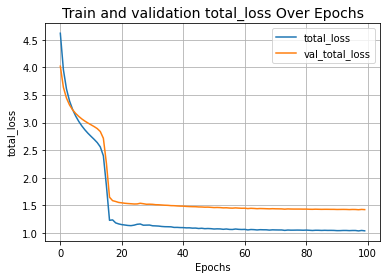

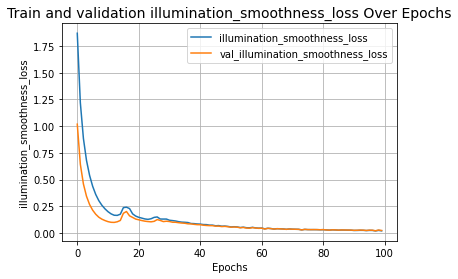

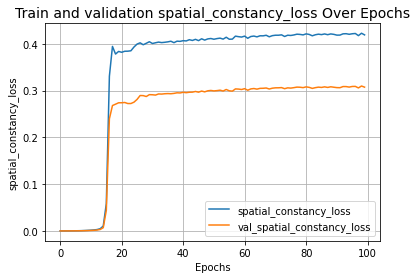

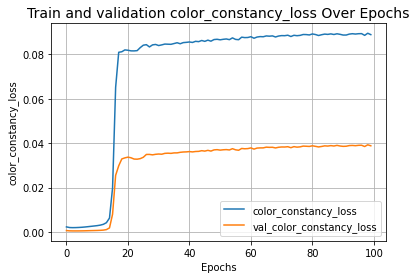

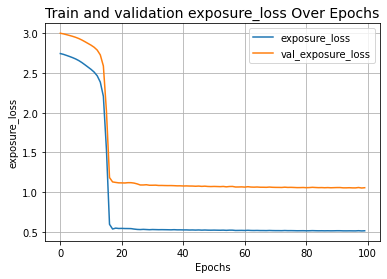

In [51]:
def plot_result(item):
    plt.plot(history.history[item], label=item)
    plt.plot(history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()
plot_result("total_loss")
plot_result("illumination_smoothness_loss")
plot_result("spatial_constancy_loss")
plot_result("color_constancy_loss")
plot_result("exposure_loss")

In [52]:
def plot_results(images, titles, figure_size=(12, 12)):
    fig = plt.figure(figsize=figure_size)
    for i in range(len(images)):
        fig.add_subplot(1, len(images), i + 1).set_title(titles[i])
        _ = plt.imshow(images[i])
        plt.axis("off")
    plt.show()
    
def infer(original_image):
    image = keras.preprocessing.image.img_to_array(original_image)
    image = image.astype("float32") / 255.0
    image = np.expand_dims(image, axis=0)
    output_image = zero_dce_model(image)
    output_image = tf.cast((output_image[0, :, :, :] * 255), dtype=np.uint8)
    output_image = Image.fromarray(output_image.numpy())
    return output_image

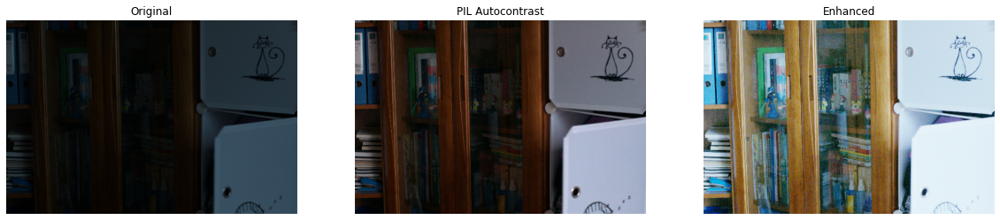

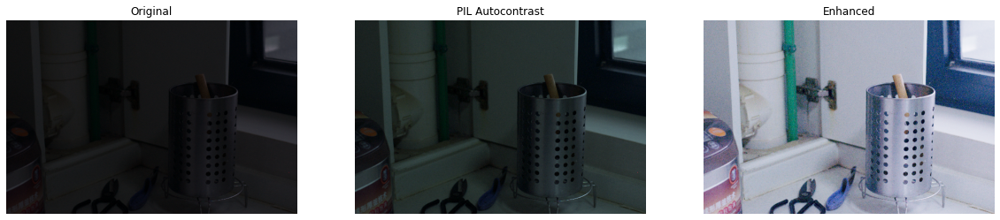

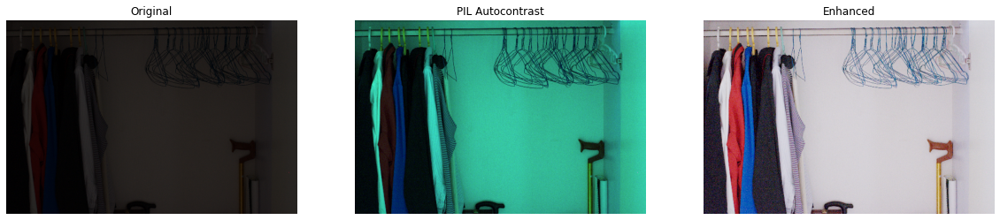

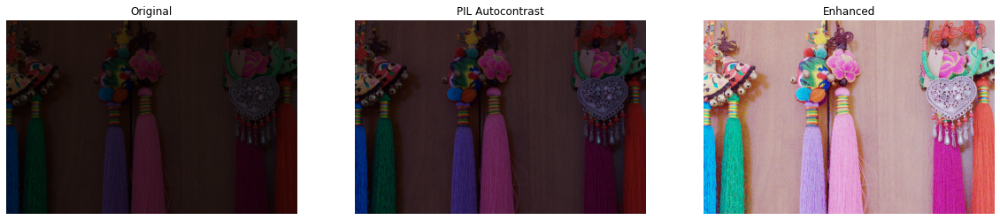

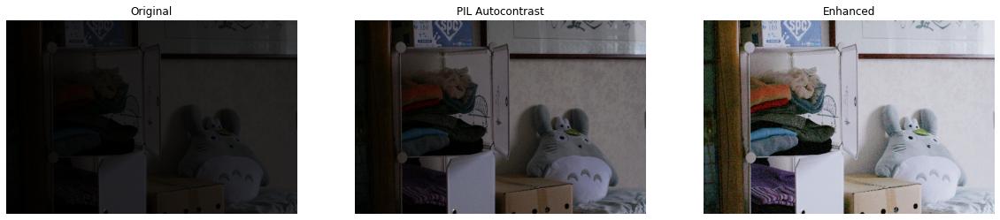

...

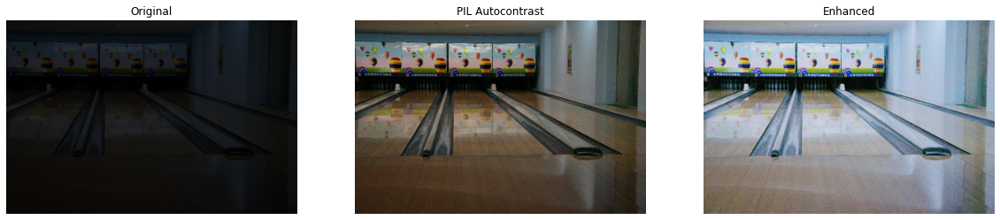

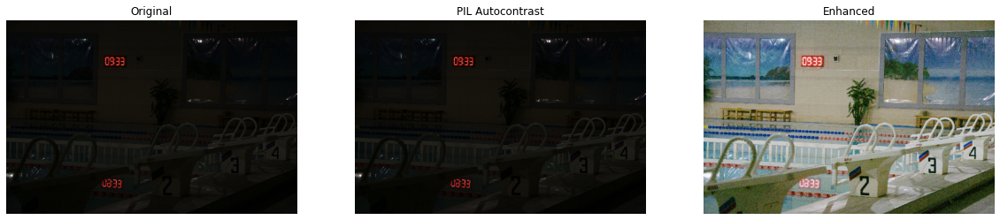

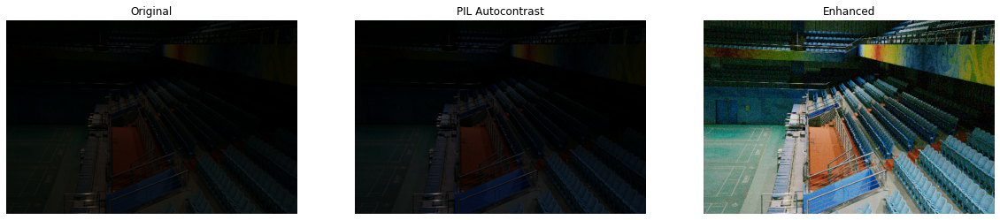

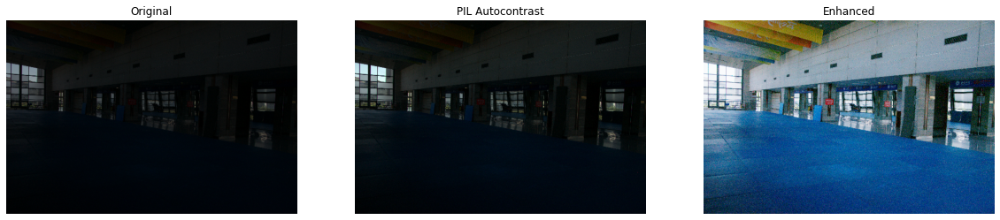

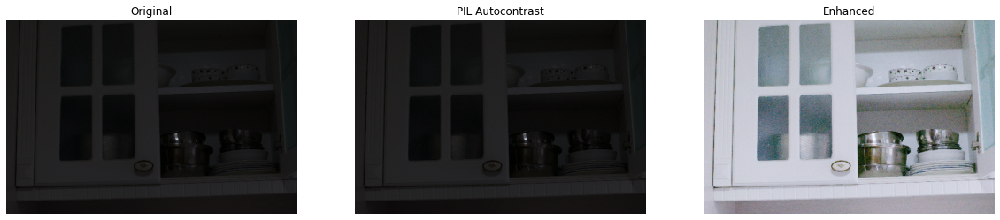

In [53]:
for val_image_file in test_low_light_images:
    original_image = Image.open(val_image_file)
    enhanced_image = infer(original_image)
    plot_results([original_image, ImageOps.autocontrast(original_image), enhanced_image], 
                ["Original", "PIL Autocontrast", "Enhanced"], (20, 12))

# Project 41

In [1]:
import tensorflow as tf
import numpy as np

In [3]:
batch_size = 32
raw_train_ds = tf.keras.preprocessing.text_dataset_from_directory("D:/datasets_CSV/aclImdb/train", 
                                                        batch_size=batch_size, validation_split=0.2, 
                                                                  subset="training", seed=1337)
raw_val_ds = tf.keras.preprocessing.text_dataset_from_directory("D:/datasets_CSV/aclImdb/train", 
                        batch_size=batch_size, validation_split=0.2, subset="validation", seed=1337)
raw_test_ds = tf.keras.preprocessing.text_dataset_from_directory("D:/datasets_CSV/aclImdb/test", 
                    batch_size=batch_size)
print(f"Number of batches is raw_train_ds: {raw_train_ds.cardinality()}")
print(f"Number of batches in raw_val_ds: {raw_val_ds.cardinality()}")
print(f"Number of batches in raw_test_ds: {raw_test_ds.cardinality()}")

Found 25000 files belonging to 2 classes.
Using 20000 files for training.
Found 25000 files belonging to 2 classes.
Using 5000 files for validation.
Found 25000 files belonging to 2 classes.
Number of batches is raw_train_ds: 625
Number of batches in raw_val_ds: 157
Number of batches in raw_test_ds: 782


In [5]:
for text_batch, label_batch in raw_train_ds.take(1):
    for i in range(5):
        print(text_batch.numpy()[i])
        print(label_batch.numpy()[i])

b'I\'ve seen tons of science fiction from the 70s; some horrendously bad, and others thought provoking and truly frightening. Soylent Green fits into the latter category. Yes, at times it\'s a little campy, and yes, the furniture is good for a giggle or two, but some of the film seems awfully prescient. Here we have a film, 9 years before Blade Runner, that dares to imagine the future as somthing dark, scary, and nihilistic. Both Charlton Heston and Edward G. Robinson fare far better in this than The Ten Commandments, and Robinson\'s assisted-suicide scene is creepily prescient of Kevorkian and his ilk. Some of the attitudes are dated (can you imagine a filmmaker getting away with the "women as furniture" concept in our oh-so-politically-correct-90s?), but it\'s rare to find a film from the Me Decade that actually can make you think. This is one I\'d love to see on the big screen, because even in a widescreen presentation, I don\'t think the overall scope of this film would receive its

In [8]:
from tensorflow.keras.layers import TextVectorization
import string
import re

def custom_standardization(input_data):
    lowercase = tf.strings.lower(input_data)
    stripped_html = tf.strings.regex_replace(lowercase, "<br />", " ")
    return tf.strings.regex_replace(stripped_html, f"[{re.escape(string.punctuation)}]", "")

max_features = 20000
embedding_dim = 128
sequence_length = 500

vectorize_layer = TextVectorization(standardize=custom_standardization, max_tokens=max_features, output_mode="int",
                                   output_sequence_length=sequence_length)

text_ds = raw_train_ds.map(lambda x, y: x)
vectorize_layer.adapt(text_ds)

In [9]:
def vectorize_text(text, label):
    text = tf.expand_dims(text, -1)
    return vectorize_layer(text), label

train_ds = raw_train_ds.map(vectorize_text)
val_ds = raw_val_ds.map(vectorize_text)
test_ds = raw_test_ds.map(vectorize_text)

train_ds = train_ds.cache().prefetch(buffer_size=10)
val_ds = val_ds.cache().prefetch(buffer_size=10)
test_ds = test_ds.cache().prefetch(buffer_size=10)

In [10]:
from tensorflow.keras import layers

inputs = tf.keras.Input(shape=(None, ), dtype="int64")
x = layers.Embedding(max_features, embedding_dim)(inputs)
x = layers.Dropout(0.5)(x)

x = layers.Conv1D(128, 7, padding="valid", activation="relu", strides=3)(x)
x = layers.Conv1D(128, 7, padding="valid", activation="relu", strides=3)(x)

x = layers.GlobalMaxPooling1D()(x)

x = layers.Dense(128, activation="relu")(x)
x = layers.Dropout(0.5)(x)

predictions = layers.Dense(1, activation="sigmoid", name="predictions")(x)

model = tf.keras.Model(inputs, predictions)

model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [11]:
epochs = 3
model.fit(train_ds, validation_data=val_ds, epochs=epochs)

Epoch 1/3
625/625 [==============================] - 146s 231ms/step - loss: 0.4984 - accuracy: 0.7124 - val_loss: 0.3220 - val_accuracy: 0.8646
Epoch 2/3
625/625 [==============================] - 107s 172ms/step - loss: 0.2189 - accuracy: 0.9148 - val_loss: 0.3055 - val_accuracy: 0.8756
Epoch 3/3
625/625 [==============================] - 108s 173ms/step - loss: 0.1157 - accuracy: 0.9577 - val_loss: 0.3698 - val_accuracy: 0.8728


In [12]:
model.evaluate(test_ds)

782/782 [==============================] - 142s 179ms/step - loss: 0.4191 - accuracy: 0.8600


[0.4191037118434906, 0.8599600195884705]

In [14]:
inputs = tf.keras.Input(shape=(1, ), dtype="string")
indices = vectorize_layer(inputs)
outputs = model(indices)
end_to_end_model = tf.keras.Model(inputs, outputs)

end_to_end_model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
end_to_end_model.evaluate(raw_test_ds)

782/782 [==============================] - 34s 42ms/step - loss: 0.4191 - accuracy: 0.8600


[0.41910359263420105, 0.8599600195884705]

# Project 42

In [15]:
import tensorflow_datasets as tfds
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import re
import string

tfds.disable_progress_bar()

In [17]:
dataset = tfds.load("imdb_reviews", split="train + test", as_supervised=True, batch_size=-1, shuffle_files=False)
reviews, labels = tfds.as_numpy(dataset)
print("Total examples:", reviews.shape[0])

Dataset imdb_reviews downloaded and prepared to C:\Users\jatin\tensorflow_datasets\imdb_reviews\plain_text\1.0.0. Subsequent calls will reuse this data.
Instructions for updating:
Use `tf.data.Dataset.get_single_element()`.


Instructions for updating:
Use `tf.data.Dataset.get_single_element()`.


Total examples: 50000


In [25]:
val_split = 2500
test_split = 2500
train_split = 7500

x_positives, y_positives = reviews[labels == 1], labels[labels == 1]
x_negatives, y_negatives = reviews[labels == 0], labels[labels == 0]

x_val, y_val = (tf.concat((x_positives[:val_split], x_negatives[:val_split]), 0), 
               tf.concat((y_positives[:val_split], y_negatives[:val_split]), 0))
x_test, y_test = (tf.concat((x_positives[val_split:val_split + test_split], 
                             x_negatives[val_split:val_split + test_split]), 0, ), 
                 tf.concat((y_positives[val_split:val_split + test_split], 
                            y_negatives[val_split:val_split + test_split]), 0), )
x_train, y_train = (tf.concat((x_positives[val_split+test_split:val_split+test_split+train_split],
                              x_negatives[val_split+test_split:val_split+test_split+train_split]), 0),
                   tf.concat((y_positives[val_split+test_split:val_split+test_split+train_split], 
                             y_negatives[val_split+test_split:val_split+test_split+train_split]), 0), )
x_pool_positives, y_pool_positives = (x_positives[val_split+test_split+train_split:], 
                                      y_positives[val_split+test_split+train_split:])
x_pool_negatives, y_pool_negatives = (x_negatives[val_split+test_split+train_split:], 
                                     y_negatives[val_split+test_split+train_split:])
train_dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train))
val_dataset = tf.data.Dataset.from_tensor_slices((x_val, y_val))
test_dataset = tf.data.Dataset.from_tensor_slices((x_test, y_test))

pool_negatives = tf.data.Dataset.from_tensor_slices((x_pool_negatives, y_pool_negatives))
pool_positives = tf.data.Dataset.from_tensor_slices((x_pool_positives, y_pool_positives))

print(f"Initial training set size: {len(train_dataset)}")
print(f"Validation set size: {len(val_dataset)}")
print(f"Testing set size: {len(test_dataset)}")
print(f"Unlabeled negative pool: {len(pool_negatives)}")
print(f"Unlabeld positive pool: {len(pool_positives)}")

Initial training set size: 15000
Validation set size: 5000
Testing set size: 5000
Unlabeled negative pool: 12500
Unlabeld positive pool: 12500


In [26]:
def custom_standardization(input_data):
    lowercase = tf.strings.lower(input_data)
    stripped_html = tf.strings.regex_replace(lowercase, "<br />", " ")
    return tf.strings.regex_replace(stripped_html, f"[{re.escape(string.punctuation)}]", "")

vectorizer = layers.TextVectorization(3000, standardize=custom_standardization, output_sequence_length=150)
vectorizer.adapt(train_dataset.map(lambda x, y: x, num_parallel_calls=tf.data.AUTOTUNE).batch(256))

def vectorize_text(text, label):
    text = vectorizer(text)
    return text, label

train_dataset = train_dataset.map(vectorize_text, num_parallel_calls=tf.data.AUTOTUNE).prefetch(tf.data.AUTOTUNE)
pool_negatives = pool_negatives.map(vectorize_text, num_parallel_calls=tf.data.AUTOTUNE)
pool_positives = pool_positives.map(vectorize_text, num_parallel_calls=tf.data.AUTOTUNE)

val_dataset = val_dataset.batch(256).map(vectorize_text, num_parallel_calls=tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(256).map(vectorize_text, num_parallel_calls=tf.data.AUTOTUNE)

In [27]:
def append_history(losses, val_losses, accuracy, val_accuracy, history):
    losses = losses + history.history["loss"]
    val_losses = val_losses + history.history["val_loss"]
    accuracy = accuracy + history.history["binary_accuracy"]
    val_accuracy = val_accuracy + history.history["val_binary_accuracy"]
    return losses, val_losses, accuracy, val_accuracy

def plot_history(losses, val_losses, accuracies, val_accuracies):
    plt.plot(losses)
    plt.plot(val_losses)
    plt.legend(["train_loss", "val_loss"])
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.show()
    
    plt.plot(accuracies)
    plt.plot(val_accuracies)
    plt.legend(["train_accuracy", "val_accuracy"])
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.show()

In [30]:
def create_model():
    model = keras.models.Sequential([
        layers.Input(shape=(150, )),
        layers.Embedding(input_dim=3000, output_dim=128),
        layers.Bidirectional(layers.LSTM(32, return_sequences=True)),
        layers.GlobalMaxPool1D(),
        layers.Dense(20, activation="relu"),
        layers.Dropout(0.5),
        layers.Dense(1, activation="sigmoid")
    ])
    model.summary()
    return model

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 150, 128)          384000    
                                                                 
 bidirectional_1 (Bidirectio  (None, 150, 64)          41216     
 nal)                                                            
                                                                 
 global_max_pooling1d_2 (Glo  (None, 64)               0         
 balMaxPooling1D)                                                
                                                                 
 dense_3 (Dense)             (None, 20)                1300      
                                                                 
 dropout_3 (Dropout)         (None, 20)                0         
                                                                 
 dense_4 (Dense)             (None, 1)                

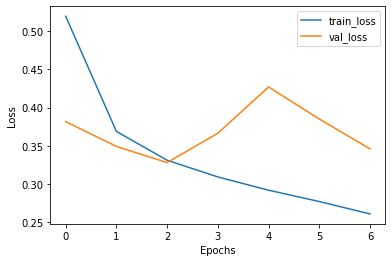

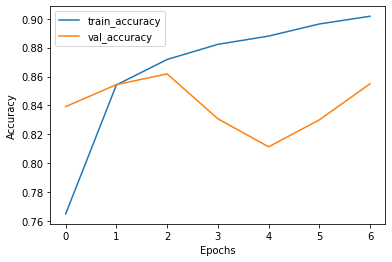

----------------------------------------------------------------------------------------------------
Test set evaluation: {'loss': 0.34844204783439636, 'binary_accuracy': 0.8578000068664551, 'false_negatives_1': 433.0, 'false_positives': 278.0}
----------------------------------------------------------------------------------------------------


In [32]:
def train_full_model(full_train_dataset, val_dataset, test_dataset):
    model = create_model()
    model.compile(loss="binary_crossentropy", optimizer="rmsprop", metrics=[
        keras.metrics.BinaryAccuracy(),
        keras.metrics.FalseNegatives(),
        keras.metrics.FalsePositives(),
    ])
    history = model.fit(full_train_dataset.batch(256), epochs=20, validation_data=val_dataset, callbacks=[
        keras.callbacks.EarlyStopping(patience=4, verbose=1)
    ])
    plot_history(history.history["loss"], history.history["val_loss"], history.history["binary_accuracy"], 
                history.history["val_binary_accuracy"])
    print("-"*100)
    print("Test set evaluation:", model.evaluate(test_dataset, verbose=0, return_dict=True))
    print("-"*100)
    return model

full_train_dataset = (train_dataset.concatenate(pool_positives).concatenate(pool_negatives).cache().shuffle(20000))
full_dataset_model = train_full_model(full_train_dataset, val_dataset, test_dataset)

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_6 (Embedding)     (None, 150, 128)          384000    
                                                                 
 bidirectional_4 (Bidirectio  (None, 150, 64)          41216     
 nal)                                                            
                                                                 
 global_max_pooling1d_5 (Glo  (None, 64)               0         
 balMaxPooling1D)                                                
                                                                 
 dense_9 (Dense)             (None, 20)                1300      
                                                                 
 dropout_6 (Dropout)         (None, 20)                0         
                                                                 
 dense_10 (Dense)            (None, 1)                

Epoch 1/20
118/118 [==============================] - 91s 705ms/step - loss: 0.2190 - binary_accuracy: 0.9261 - false_negatives_7: 947.0000 - false_positives_6: 1269.0000 - val_loss: 0.4016 - val_binary_accuracy: 0.8406 - val_false_negatives_7: 399.0000 - val_false_positives_6: 398.0000
Epoch 2/20
118/118 [==============================] - 82s 696ms/step - loss: 0.1965 - binary_accuracy: 0.9361 - false_negatives_7: 852.0000 - false_positives_6: 1064.0000 - val_loss: 0.4322 - val_binary_accuracy: 0.8368 - val_false_negatives_7: 449.0000 - val_false_positives_6: 367.0000
Epoch 3/20
118/118 [==============================] - 79s 673ms/step - loss: 0.1756 - binary_accuracy: 0.9428 - false_negatives_7: 733.0000 - false_positives_6: 982.0000 - val_loss: 0.5959 - val_binary_accuracy: 0.8022 - val_false_negatives_7: 779.0000 - val_false_positives_6: 210.0000
Epoch 4/20
118/118 [==============================] - 80s 677ms/step - loss: 0.1614 - binary_accuracy: 0.9483 - false_negatives_7: 688.00

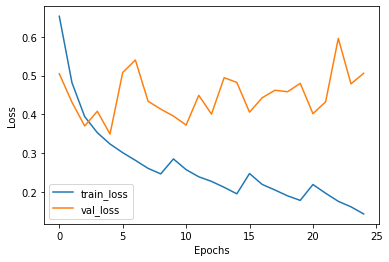

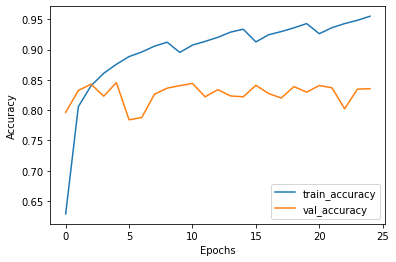

----------------------------------------------------------------------------------------------------
Test set evaluation: {'loss': 0.5015410780906677, 'binary_accuracy': 0.8371999859809875, 'false_negatives_7': 449.0, 'false_positives_6': 365.0}
----------------------------------------------------------------------------------------------------


In [36]:
def train_active_learning_models(train_dataset, pool_negatives, pool_positives, val_dataset, test_dataset, 
                                 num_iterations=3, sampling_size=5000):
    losses, val_losses, accuracies, val_accuracies = [], [], [], []
    model = create_model()
    model.compile(loss="binary_crossentropy", optimizer="rmsprop", metrics=[
        keras.metrics.BinaryAccuracy(),
        keras.metrics.FalseNegatives(),
        keras.metrics.FalsePositives(),
    ],)
    early_stopping = keras.callbacks.EarlyStopping(patience=4, verbose=1)
    print(f"Starting to train with {len(train_dataset)} samples")
    history = model.fit(train_dataset.cache().shuffle(20000).batch(256), epochs=20, validation_data=val_dataset, 
                       callbacks=[early_stopping])
    losses, val_losses, accuracies, val_accuracies = append_history(losses, val_losses, accuracies, val_accuracies, 
                                                                   history)
    for iteration in range(num_iterations):
        predictions = model.predict(test_dataset)
        rounded = tf.where(tf.greater(predictions, 0.5), 1, 0)
        _, _, false_negatives, false_positives = model.evaluate(test_dataset, verbose=0)
        print("-"*100)
        print(f"Number of zeros incorrectly classified: {false_negatives}, Number of ones incorrectly classified: {false_positives}")
        if false_negatives != 0 and false_positives != 0:
            total = false_negatives + false_positives
            sample_ratio_ones, sample_ratio_zeros = (false_positives / total, false_negatives / total)
        else:
            sample_ratio_ones, sample_ratio_zeros = 0.5, 0.5
        print(f"Sample ratio for positives: {sample_ratio_ones}, Sample ratio for negatives: {sample_ratio_zeros}")
        sampled_dataset = pool_negatives.take(int(sample_ratio_zeros * sampling_size)).concatenate(pool_positives.take(int(sample_ratio_ones * sampling_size)))
        pool_negatives = pool_negatives.skip(int(sample_ratio_zeros * sampling_size))
        pool_positives = pool_positives.skip(int(sample_ratio_ones * sampling_size))
        train_dataset = train_dataset.concatenate(sampled_dataset).prefetch(tf.data.AUTOTUNE)
        print(f"Starting training with {len(train_dataset)} samples")
        print("-"*100)
        model.compile(loss="binary_crossentropy", optimizer="rmsprop", metrics=[
            keras.metrics.BinaryAccuracy(), 
            keras.metrics.FalseNegatives(),
            keras.metrics.FalsePositives(),
        ], )
        history = model.fit(train_dataset.cache().shuffle(20000).batch(256), validation_data=val_dataset, epochs=20
                           , callbacks=[keras.callbacks.EarlyStopping(patience=4, verbose=1)])
        losses, val_losses, accuracies, val_accuracies=append_history(losses, val_losses, accuracies,
                                                                      val_accuracies, history)
    plot_history(losses, val_losses, accuracies, val_accuracies)
    print("-"*100)
    print("Test set evaluation:", model.evaluate(test_dataset, verbose=0, return_dict=True))
    print("-"*100)
    return model
active_learning_model = train_active_learning_models(train_dataset, pool_negatives, pool_positives, val_dataset,
                                                     test_dataset)

# Project 43

In [23]:
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np

TRAINING_SIZE = 50000
DIGITS = 3
REVERSE = True

MAXLEN = DIGITS + 1 + DIGITS

In [26]:
class CharacterTable:
    def __init__(self, chars):
        self.chars = sorted(set(chars))
        self.char_indices = dict((c, i) for i, c in enumerate(self.chars))
        self.indices_char = dict((i, c) for i, c in enumerate(self.chars))
    def encode(self, C, num_rows):
        x = np.zeros((num_rows, len(self.chars)))
        for i, c in enumerate(C):
            x[i, self.char_indices[c]] = 1
        return x
    def decode(self, x, calc_argmax=True):
        if calc_argmax:
            x = x.argmax(axis=-1)
        return "".join(self.indices_char[x] for x in x)

chars = "0123456789+"
ctable = CharacterTable(chars)

questions = []
expected = []
seen = set()
print("Generating data...")
while len(questions) < TRAINING_SIZE:
    f = lambda: int("".join(np.random.choice(list("012345679")) for i in range(np.random.randint(1, DIGITS + 1))))
    a, b = f(), f()
    key = tuple(sorted((a, b)))
    if key in seen:
        continue
    seen.add(key)
    
    q = "{}+{}".format(a, b)
    query = q + "" * (MAXLEN - len(q))
    ans = str(a + b)
    ans += "" * (DIGITS + 1 - len(ans))
    if REVERSE:
        query = query[::-1]
    questions.append(query)
    expected.append(ans)
print("Total questions:", len(questions))

Generating data...
Total questions: 50000


In [27]:
print("Vectorization...")
x = np.zeros((len(questions), MAXLEN, len(chars)), dtype=np.bool)
y = np.zeros((len(questions), DIGITS + 1, len(chars)), dtype=np.bool)
for i, sentence in enumerate(questions):
    x[i] = ctable.encode(sentence, MAXLEN)
for i, sentence in enumerate(expected):
    y[i] = ctable.encode(sentence, DIGITS+1)

indices = np.arange(len(y))
np.random.shuffle(indices)
x = x[indices]
y = y[indices]

split_at = len(x) - len(x) // 10
(x_train, x_val) = x[:split_at], x[split_at:]
(y_train, y_val) = y[:split_at], y[split_at:]

print("Training Data:")
print(x_train.shape)
print(y_train.shape)

print("Validation Data:")
print(x_val.shape)
print(y_val.shape)

Vectorization...


<ipython-input-27-19162beecb4c>:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  x = np.zeros((len(questions), MAXLEN, len(chars)), dtype=np.bool)
<ipython-input-27-19162beecb4c>:3: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y = np.zeros((len(questions), DIGITS + 1, len(chars)), dtype=np.bool)


Training Data:
(45000, 7, 11)
(45000, 4, 11)
Validation Data:
(5000, 7, 11)
(5000, 4, 11)


In [28]:
print("Build model...")
num_layers = 1
model = keras.Sequential()
model.add(layers.LSTM(128, input_shape=(MAXLEN, len(chars))))
model.add(layers.RepeatVector(DIGITS + 1))
for _ in range(num_layers):
    model.add(layers.LSTM(128, return_sequences=True))
model.add(layers.Dense(len(chars), activation="softmax"))
model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])
model.summary()

Build model...
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 128)               71680     
                                                                 
 repeat_vector (RepeatVector  (None, 4, 128)           0         
 )                                                               
                                                                 
 lstm_1 (LSTM)               (None, 4, 128)            131584    
                                                                 
 dense (Dense)               (None, 4, 11)             1419      
                                                                 
Total params: 204,683
Trainable params: 204,683
Non-trainable params: 0
_________________________________________________________________


In [29]:
epochs = 30
batch_size = 32

for epoch in range(1, epochs):
    print()
    print("Iteration", epoch)
    model.fit(x_train, y_train, batch_size=batch_size, epochs=1, validation_data=(x_val, y_val))
    for i in range(10):
        ind = np.random.randint(0, len(x_val))
        rowx, rowy = x_val[np.array([ind])], y_val[np.array([ind])]
        preds = np.argmax(model.predict(rowx), axis=-1)
        q = ctable.decode(rowx[0])
        correct = ctable.decode(rowy[0])
        guess = ctable.decode(preds[0], calc_argmax=False)
        print("Q", q[::-1] if REVERSE else q, end=" ")
        print("T", correct, end=" ")
        if correct == guess:
            print("right " + guess)
        else:
            print("not right " + guess)


Iteration 1
1407/1407 [==============================] - 17s 10ms/step - loss: 1.7696 - accuracy: 0.1232 - val_loss: 1.7678 - val_accuracy: 0.1177
Q +215+54 T 269+ not right 1444
Q +23+544 T 567+ not right 1444
Q 669+940 T 1609 not right 1444
Q +54+135 T 189+ not right 1444
Q +566+46 T 612+ not right 1444
Q 251+917 T 1168 not right 1444
Q +664+31 T 695+ not right 1444
Q +115+63 T 178+ not right 1444
Q 996+249 T 1245 not right 1444
Q +61+705 T 766+ not right 1444

Iteration 2
1407/1407 [==============================] - 13s 9ms/step - loss: 1.7644 - accuracy: 0.1249 - val_loss: 1.7655 - val_accuracy: 0.1252
Q +934+17 T 951+ not right 1111
Q +64+269 T 333+ not right 1111
Q +151+99 T 250+ not right 1111
Q 616+455 T 1071 not right 1111
Q +77+496 T 573+ not right 1111
Q 139+731 T 870+ not right 1111
Q +61+753 T 814+ not right 1111
Q ++67+56 T 123+ not right 1111
Q 244+232 T 476+ not right 1111
Q +654+31 T 685+ not right 1111

Iteration 3
1407/1407 [==============================] - 15s 11m

Q 693+452 T 1145 right 1145
Q +65+697 T 762+ not right 7628
Q +297+23 T 320+ not right 3208
Q ++249+4 T 253+ not right 2538
Q 594+222 T 816+ not right 8168
Q 631+551 T 1182 not right 1082

Iteration 19
1407/1407 [==============================] - 15s 11ms/step - loss: 0.1388 - accuracy: 0.7626 - val_loss: 0.0974 - val_accuracy: 0.7734
Q 704+515 T 1219 right 1219
Q 737+276 T 1013 right 1013
Q +34+363 T 397+ not right 3971
Q +375+64 T 439+ not right 4391
Q ++39+30 T 69++ not right 6911
Q +799+35 T 834+ not right 8341
Q ++219+6 T 225+ not right 2251
Q +314+61 T 375+ not right 3751
Q 615+799 T 1414 not right 1413
Q 373+724 T 1097 right 1097

Iteration 20
1407/1407 [==============================] - 15s 11ms/step - loss: 0.0690 - accuracy: 0.7821 - val_loss: 0.0622 - val_accuracy: 0.7828
Q 390+731 T 1121 right 1121
Q ++0+992 T 992+ not right 9926
Q 966+177 T 1143 right 1143
Q +651+33 T 684+ not right 6846
Q +57+692 T 749+ not right 7496
Q 241+556 T 797+ not right 8976
Q ++45+72 T 117+ not r

# Project 44

In [30]:
import numpy as np
from tensorflow import keras
from tensorflow.keras import layers

max_features = 20000
maxlen = 200

In [32]:
inputs = keras.Input(shape=(None, ), dtype="int32")
x = layers.Embedding(max_features, 128)(inputs)
x = layers.Bidirectional(layers.LSTM(64, return_sequences=True))(x)
x = layers.Bidirectional(layers.LSTM(64))(x)
outputs = layers.Dense(1, activation="sigmoid")(x)
model = keras.Model(inputs, outputs)
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding_1 (Embedding)     (None, None, 128)         2560000   
                                                                 
 bidirectional_1 (Bidirectio  (None, None, 128)        98816     
 nal)                                                            
                                                                 
 bidirectional_2 (Bidirectio  (None, 128)              98816     
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 129       
                                                                 
Total params: 2,757,761
Trainable params: 2,757,761
Non-train

In [35]:
(x_train, y_train), (x_val, y_val) = keras.datasets.imdb.load_data(num_words=max_features)
print(len(x_train), "Training sequences")
print(len(x_val), "Validation sequences")
x_train = keras.preprocessing.sequence.pad_sequences(x_train, maxlen=maxlen)
x_val = keras.preprocessing.sequence.pad_sequences(x_val, maxlen=maxlen)

25000 Training sequences
25000 Validation sequences


In [36]:
model.compile("adam", "binary_crossentropy", metrics=["accuracy"])
model.fit(x_train, y_train, batch_size=32, epochs=2, validation_data=(x_val, y_val))

Epoch 1/2
782/782 [==============================] - 410s 514ms/step - loss: 0.3846 - accuracy: 0.8305 - val_loss: 0.3353 - val_accuracy: 0.8579
Epoch 2/2
782/782 [==============================] - 382s 489ms/step - loss: 0.2296 - accuracy: 0.9136 - val_loss: 0.3296 - val_accuracy: 0.8679


# Project 45

In [1]:
import numpy as np
import tensorflow as tf
from tensorflow import keras

In [2]:
batch_size = 64
epochs = 100
latent_dim = 256
num_samples = 10000
data_path = "D:/datasets_CSV/fra-eng/fra.txt"

In [5]:
input_texts = []
target_texts = []
input_characters = set()
target_characters = set()
with open(data_path, "r", encoding="utf-8") as f:
    lines = f.read().split("\n")
for line in lines[: min(num_samples, len(lines) - 1)]:
    input_text, target_text, _ = line.split("\t")
    target_text = "\t" + target_text + "\n"
    input_texts.append(input_text)
    target_texts.append(target_text)
    for char in input_text:
        if char not in input_characters:
            input_characters.add(char)
    for char in target_text:
        if char not in target_characters:
            target_characters.add(char)

input_characters = sorted(list(input_characters))
target_characters = sorted(list(target_characters))
num_encoder_tokens = len(input_characters)
num_decoder_tokens = len(target_characters)
max_encoder_seq_length = max([len(txt) for txt in input_texts])
max_decoder_seq_length = max([len(txt) for txt in target_texts])

print("Number of samples:", len(input_texts))
print("Number of unique input tokens:", num_encoder_tokens)
print("Number of unque output tokens:", num_decoder_tokens)
print("Max sequence length for inputs:", max_encoder_seq_length)
print("Max sequence length for outputs:", max_decoder_seq_length)

input_token_index = dict([(char, i) for i, char in enumerate(input_characters)])
target_token_index = dict([(char, i) for i, char in enumerate(target_characters)])

encoder_input_data = np.zeros((len(input_texts), max_encoder_seq_length, num_encoder_tokens), dtype="float32")
decoder_input_data = np.zeros((len(input_texts), max_decoder_seq_length, num_decoder_tokens), dtype="float32")
decoder_target_data = np.zeros((len(input_texts), max_decoder_seq_length, num_decoder_tokens), dtype="float32")

for i, (input_text, target_text) in enumerate(zip(input_texts, target_texts)):
    for t, char in enumerate(input_text):
        encoder_input_data[i, t, input_token_index[char]] = 1.0
    encoder_input_data[i, t + 1 :, input_token_index[" "]] = 1.0
    for t, char in enumerate(target_text):
        decoder_input_data[i, t, target_token_index[char]] = 1.0
        if t > 0:
            decoder_target_data[i, t - 1, target_token_index[char]] = 1.0
    decoder_input_data[i, t + 1: , target_token_index[char]] = 1.0
    decoder_target_data[i, t:, target_token_index[" "]] = 1.0

Number of samples: 10000
Number of unique input tokens: 71
Number of unque output tokens: 93
Max sequence length for inputs: 15
Max sequence length for outputs: 59


In [6]:
encoder_inputs = keras.Input(shape=(None, num_encoder_tokens))
encoder = keras.layers.LSTM(latent_dim, return_state=True)
emcoder_outputs, state_h, state_c = encoder(encoder_inputs)

encoder_states = [state_h, state_c]

decoder_inputs = keras.Input(shape=(None, num_decoder_tokens))

decoder_lstm = keras.layers.LSTM(latent_dim, return_sequences=True, return_state=True)
decoder_outputs, _, _ = decoder_lstm(decoder_inputs, initial_state=encoder_states)
decoder_dense = keras.layers.Dense(num_decoder_tokens, activation="softmax")
decoder_outputs = decoder_dense(decoder_outputs)

model = keras.Model([encoder_inputs, decoder_inputs], decoder_outputs)

In [7]:
model.compile(optimizer="rmsprop", loss="categorical_crossentropy", metrics=["accuracy"])
model.fit([encoder_input_data, decoder_input_data], decoder_target_data, batch_size=batch_size, epochs=epochs, 
         validation_split=0.2)

Epoch 1/100
125/125 [==============================] - 54s 388ms/step - loss: 1.1330 - accuracy: 0.7316 - val_loss: 1.0215 - val_accuracy: 0.7121
Epoch 2/100
125/125 [==============================] - 46s 369ms/step - loss: 0.8073 - accuracy: 0.7790 - val_loss: 0.8234 - val_accuracy: 0.7670
Epoch 3/100
125/125 [==============================] - 46s 367ms/step - loss: 0.6332 - accuracy: 0.8207 - val_loss: 0.6875 - val_accuracy: 0.7982
Epoch 4/100
125/125 [==============================] - 46s 371ms/step - loss: 0.5590 - accuracy: 0.8371 - val_loss: 0.6161 - val_accuracy: 0.8209
Epoch 5/100
125/125 [==============================] - 46s 367ms/step - loss: 0.5156 - accuracy: 0.8488 - val_loss: 0.5879 - val_accuracy: 0.8277
Epoch 6/100
125/125 [==============================] - 46s 367ms/step - loss: 0.4814 - accuracy: 0.8581 - val_loss: 0.5530 - val_accuracy: 0.8381
Epoch 7/100
125/125 [==============================] - 46s 368ms/step - loss: 0.4552 - accuracy: 0.8653 - val_loss: 0.5323 -

Epoch 57/100
125/125 [==============================] - 46s 368ms/step - loss: 0.1004 - accuracy: 0.9682 - val_loss: 0.5766 - val_accuracy: 0.8753
Epoch 58/100
125/125 [==============================] - 46s 367ms/step - loss: 0.0988 - accuracy: 0.9686 - val_loss: 0.5775 - val_accuracy: 0.8753
Epoch 59/100
125/125 [==============================] - 46s 371ms/step - loss: 0.0966 - accuracy: 0.9691 - val_loss: 0.5862 - val_accuracy: 0.8757
Epoch 60/100
125/125 [==============================] - 46s 368ms/step - loss: 0.0948 - accuracy: 0.9697 - val_loss: 0.5907 - val_accuracy: 0.8759
Epoch 61/100
125/125 [==============================] - 46s 366ms/step - loss: 0.0926 - accuracy: 0.9705 - val_loss: 0.5995 - val_accuracy: 0.8745
Epoch 62/100
125/125 [==============================] - 46s 372ms/step - loss: 0.0914 - accuracy: 0.9708 - val_loss: 0.5994 - val_accuracy: 0.8752
Epoch 63/100
125/125 [==============================] - 46s 368ms/step - loss: 0.0893 - accuracy: 0.9712 - val_loss: 0

In [10]:
encoder_inputs = model.input[0]
encoder_outputs, state_h_enc, state_c_enc = model.layers[2].output
encoder_states = [state_h_enc, state_c_enc]
encoder_model = keras.Model(encoder_inputs, encoder_states)

decoder_inputs = model.input[1]
decoder_state_input_h = keras.Input(shape=(latent_dim,))
decoder_state_input_c = keras.Input(shape=(latent_dim, ))
decoder_states_inputs = [decoder_state_input_h, decoder_state_input_c]
decoder_lstm = model.layers[3]
decoder_outputs, state_h_dec, state_c_dec = decoder_lstm(decoder_inputs, initial_state=decoder_states_inputs)

decoder_states = [state_h_dec, state_c_dec]
decoder_dense = model.layers[4]
decoder_outputs = decoder_dense(decoder_outputs)
decoder_model = keras.Model([decoder_inputs] + decoder_states_inputs, [decoder_outputs] + decoder_states)

reverse_input_char_index = dict((i, char) for char, i in input_token_index.items())
reverse_target_char_index = dict((i, char) for char, i in target_token_index.items())

def decode_sequence(input_seq):
    states_value = encoder_model.predict(input_seq)
    target_seq = np.zeros((1, 1, num_decoder_tokens))
    target_seq[0, 0, target_token_index["\t"]] = 1.0
    
    stop_condition = False
    decoded_sentence = ""
    while not stop_condition:
        output_tokens, h, c = decoder_model.predict([target_seq] + states_value)
        
        sampled_token_index = np.argmax(output_tokens[0, -1, :])
        sampled_char = reverse_target_char_index[sampled_token_index]
        decoded_sentence += sampled_char
        
        if sampled_char == "\n" or len(decoded_sentence) > max_decoder_seq_length:
            stop_condition = True
        target_seq = np.zeros((1, 1, num_decoder_tokens))
        target_seq[0, 0, sampled_token_index] = 1.0
        states_value = [h, c]
    return decoded_sentence

In [11]:
for seq_index in range(20):
    input_seq = encoder_input_data[seq_index:seq_index + 1]
    decoded_sentence = decode_sequence(input_seq)
    print("-")
    print("Input sentence:", input_texts[seq_index])
    print("Decoded sentence:", decoded_sentence)

-
Input sentence: Go.
Decoded sentence: Va !

-
Input sentence: Go.
Decoded sentence: Va !

-
Input sentence: Go.
Decoded sentence: Va !

-
Input sentence: Hi.
Decoded sentence: Salut.

-
Input sentence: Hi.
Decoded sentence: Salut.

-
Input sentence: Run!
Decoded sentence: Filez !

-
Input sentence: Run!
Decoded sentence: Filez !

-
Input sentence: Run!
Decoded sentence: Filez !

-
Input sentence: Run!
Decoded sentence: Filez !

-
Input sentence: Run!
Decoded sentence: Filez !

-
Input sentence: Run!
Decoded sentence: Filez !

-
Input sentence: Run!
Decoded sentence: Filez !

-
Input sentence: Run!
Decoded sentence: Filez !

-
Input sentence: Run.
Decoded sentence: Filez !

-
Input sentence: Run.
Decoded sentence: Filez !

-
Input sentence: Run.
Decoded sentence: Filez !

-
Input sentence: Run.
Decoded sentence: Filez !

-
Input sentence: Run.
Decoded sentence: Filez !

-
Input sentence: Run.
Decoded sentence: Filez !

-
Input sentence: Run.
Decoded sentence: Filez !

